# <center> **Urban Sound Classification with Deep Learning** </center>

<img src="fotos/nyc_urban_sound_taxonomy_v0.5.png">

# <center> **Business Understanding**

## **Introduction**

The objective of this project is to **develop and evaluate deep learning classifiers capable of automatically identifying urban sounds**.
Urban sound classification is a crucial task in the field of audio signal processing, with applications ranging from noise pollution monitoring to intelligent surveillance systems.

This notebook **implements and compares two different neural network** architectures to classify unseen sound excerpts into the 10 target categories.

## **Methodology**

This project follows the **CRISP-DM (Cross-Industry Standard Process for Data Mining) methodology**, structured into six phases:

- Business Understanding
- Data Understanding
- Data Preparation
- Modeling
- Evaluation
- Deployment

## **Dataset Overview: UrbanSound8K**

This project utilizes the **UrbanSound8K dataset**, a standard benchmark for environmental sound classification.

The dataset contains **8,732 labeled sound excerpts with a duration of less than, or equal to 4 seconds**.

The sounds are categorized into **10 distinct classes** representing common urban noises:

- Air conditioner
- Car horn
- Children playing
- Dog bark
- Drilling
- Engine idling
- Gun shot
- Jackhammer
- Siren
- Street music

All excerpts are taken from field recordings uploaded to [www.freesound.org](www.freesound.org).

The files are **pre-sorted into ten folds (folders named fold1-fold10)** to facilitate reproducibility and standardized comparison with baseline results.


## **Scientific Background & Evaluation Protocol**

Although we are going to follow the CRISP-DM workflow, the specific technical implementations of the **Data Preparation** and **Evaluation** phases are strictly based on the guidelines proposed by Salamon et al. in the foundational paper: [**"A Dataset and Taxonomy for Urban Sound Research"** (2014)](http://www.justinsalamon.com/uploads/4/3/9/4/4394963/salamon_urbansound_acmmm14.pdf)

Following these scientific standards is critical to ensure the validity of our results, within the CRISP-DM framework, specifically concerning:

- **The "Data Leakage" Problem:** The 8,732 sound excerpts are **not independent**. They were often sliced from longer field recordings.

- **The Risk:** If we simply shuffle the data and split it randomly (e.g., by using standard train_test_split), slices from the same original recording could **end up in both the training and test sets**.

- **The Consequence:** The model would **"memorize" (overfit)** the background noise of the specific recording rather than learning the sound features.

- **The Solution: 10-Fold Cross-Validation**

To **solve the leakage problem**, the dataset authors pre-sorted the excerpts into **10 separate folds**.

-  **Rule:** All **excerpts derived from the same original recording are strictly placed in the same fold**.

- **Implementation:** As required by the project guidelines, we must use the official **10-fold cross-validation** scheme. In each iteration, we use **8 folds for training, 1 fold for validation and 1 fold for testing**.

The paper also discusses appropriate **feature extraction methods** for environmental sound, specifically suggesting the use of **time-frequency analysis** such as **Mel-Spectrograms** and **Mel-Frequency Cepstral Coefficients (MFCCs)**, which we will discuss later on and implement during the Data Preparation phase.

## **Urban Sound Taxonomy & Class Selection**

The **10 classes** in this dataset were not chosen randomly. They are derived from the article above, which **organizes environmental sounds into a structured hierarchy** to facilitate noise pollution monitoring.

From the full **taxonomy** (illustrated in the beggining), the authors selected these specific 10 classes based on two main criteria:
- **Relevance:** They represent the most **common sources of urban noise complaints** (e.g., *construction work, traffic*).
- **Availability:** These were the categories with **sufficient field recordings available** in the *Freesound.org* database to create a robust dataset.

The dataset focuses on these specific leaf nodes of the taxonomy:

- **Mechanical/Construction:** *drilling, jackhammer*
- **Motorized Transport/ Road:** *car_horn, engine_idling, siren*
- **Human:** *children_playing*
- **Music:** *street_music*
- **Mechanical/Social (Signals):** *gun_shot*
- **Nature/Animals:** *dog_bark*
- **Mechanical/Ventilation:** *air_conditioner*

Understanding this hierarchy will helps us **interpret confusion matrix errors** (e.g., the model might easily confuse *drilling* with *jackhammer* because they belong to the same *"Construction"* parent category).

## **UrbanSound8K Download**

The dataset was **acquired following the official guidelines** provided at [UrbanSound8K - Urban Sound Datasets](https://urbansounddataset.weebly.com/urbansound8k.html).

Access to the data requires **completing** the [Download form](https://urbansounddataset.weebly.com/download-urbansound8k.html) to **obtain a direct download link**!

# <center> **Data Understanding**

In this phase, we conduct an **Exploratory Data Analysis (EDA)** to obtain a comprehensive overview of the dataset's structure and quality.

The analysis is divided into **two main components**:

- **Metadata Analysis:** We examine the provided CSV file to assess **class balance** and **fold distribution**. A critical aspect of this dataset is the **Salience** attribute (foreground vs. background), which we will analyze to understand how **distinct sound events are distributed across classes**.

- **Audio Data Analysis:** We visualize **raw waveforms and spectrograms** to characterize the **signal properties**, specifically comparing **foreground** samples (clear events) against **background** samples (noisy environments), as this distinction significantly impacts model performance.

## **Install Dependencies**

To ensure a consistent and reproducible workflow, **the project is designed to run within a virtual environment**.

All necessary **packages and respective versions** are listed in the ***requirements.txt* file**. Additionally, the **ipykernel package** listed in the file is required to **register the virtual environment as a usable Jupyter kernel**.

This configuration ensures **environment isolation and reproducibility across different local machines**.


In [1]:
%pip install -r requirements.txt

Note: you may need to restart the kernel to use updated packages.


## **Import Libraries**

The following libraries are imported to support the project's workflow, categorized by functionality: **data manipulation, audio signal processing, visualization, deep learning frameworks, and machine learning utilities**.

In [2]:
# System and Data Manipulation
import os
import gc
import sys
import numpy as np
import pandas as pd

# Audio Processing
import librosa
import librosa.display
import IPython.display as ipd
import soundfile as sf

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

# Deep Learning (TensorFlow/Keras)
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, callbacks, regularizers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D, Activation
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

# Machine Learning Utilities (Scikit-Learn)
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.utils.class_weight import compute_class_weight

For the audio processing, we have selected **Librosa**, a Python package widely recognized as a **standard in the audio analysis communities**. This choice is based by **several technical advantages** relevant to our deep learning workflow:

- **Standardized Feature Extraction:** Librosa provides **optimized implementations** for **extracting key audio features** required for the models, specifically **Mel-Spectrograms** and **MFCCs**. It internally handles the mathematical complexities of the **Short-Time Fourier Transform (STFT) and Mel-scale conversion**.

- **Automatic Resampling:** As the *UrbanSound8K* recordings contain varying sampling rates, **Librosa's load function simplifies normalization process**. It allows for the **definition of a target sample rate at ingestion, automatically resampling all files to a consistent format**.

- **Ecosystem Integration:** The library integrates seamlessly with the Python data science stack. **Audio data is loaded directly as NumPy arrays**, ensuring **immediate compatibility** with TensorFlow/Keras for model training and Matplotlib/Seaborn for visualization.

- **Visualization Tools:** The **specialized display module (*librosa.display*)** streamlines the plotting of complex time-frequency representations such as spectrograms, which are essential for the Exploratory Data Analysis (EDA) phase.

## **Dataset Structure & Contents**

The dataset is organized into **two primary directories** and accompanied by **supplementary documentation**:

- **audio/**: Contains the sound excerpts pre-sorted into 10 subfolders (named *fold1* through *fold10*) to facilitate cross-validation.
- **metadata/**: Contains the **UrbanSound8K.csv** file, which maps each audio file to its corresponding **class and fold**.

**Supplementary Documentation Files:**

- **README.txt**: Provides essential **metadata definitions**, authorship details, and licensing terms.

- **FREESOUNDCREDITS.txt**: Lists **source attributions** for all 8,732 audio files, acknowledging the original uploaders from *Freesound.org* in compliance with Creative Commons requirements.

**Technical Note:** The directories contain **system files named *.DS_Store* (macOS artifacts)**. These contain **no relevant data** and must be **filtered out** to prevent possible interruption in the loading pipeline.

## **Data Cleaning: Removing System Artifacts**

Prior to data ingestion, a **cleanup operation is performed to remove all .DS_Store files**.

These hidden macOS system artifacts are **included in the dataset archive** and must be eliminated to **ensure that file iteration loops process exclusively valid audio files**, thereby preventing runtime I/O errors during feature extraction.

In [3]:
# Define the root directory of the dataset
dataset_root = 'UrbanSound8K'

# Counter for feedback
deleted_count = 0

# Walk through the directory tree
if os.path.exists(dataset_root):
    for root, dirs, files in os.walk(dataset_root):
        for file in files:
            if file == '.DS_Store':
                file_path = os.path.join(root, file)
                try:
                    os.remove(file_path)
                    deleted_count += 1
                except Exception as e:
                    print(f"Error deleting {file_path}: {e}")
    
    print(f"Cleanup complete. Removed {deleted_count} '.DS_Store' files.")
else:
    print(f"Directory '{dataset_root}' not found. Please check the path.")

Cleanup complete. Removed 0 '.DS_Store' files.


### **Verification**

The cleanup process targets the **dataset's directory structure**, which comprises 13 specific directory nodes where system artifacts typically reside:

1. The root directory **(*UrbanSound8K*)**;
2. The ***audio*** subdirectory;
3. The ***metadata*** subdirectory;
4. The **10 distinct *fold*** subdirectories.

This corresponds to the **13 *.DS_Store* files identified and removed**.

With the directory structure sanitized, the **pipeline is secured against file iteration errors**.

## **Metadata Analysis**

The analysis begins by **loading the *UrbanSound8K.csv* metadata registry**. This file provides the ground truth for the dataset, containing **essential attributes** such as **class labels, fold assignments, and time-stamps** for every audio sample.

Additionally, a **duration attribute** is computed (derived from start/end times) to support the subsequent **signal length analysis**.

In [4]:
metadata_df = pd.read_csv('UrbanSound8K/metadata/UrbanSound8K.csv')

metadata_df['duration'] = metadata_df['end'] - metadata_df['start']

metadata_df.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class,duration
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark,0.317551
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing,4.000000
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing,4.000000
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing,4.000000
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing,4.000000


### **Metadata Attributes**

According to the **dataset documentation (*README.txt*)**, the *UrbanSound8K.csv* file contains **critical metadata** for each audio sample. Understanding these columns is **essential for our data loading and splitting strategy**:

-  **slice_file_name**: The **specific filename of the audio excerpt**. It follows a structured naming convention: *[fsID] - [classID] - [occurrenceID] - [sliceID].wav.*

-  **fsID**: The **unique identifier of the original recording** on *Freesound.org*.

-  **start/ end**: The start and end **timestamps (in seconds)** of the excerpt within the original recording.

-  **salience**: A subjective rating of the sound's prominence:
    -  **1** = **Foreground** (clear sound)
    -  **2** = **Background** (mixed with noise)

- **fold**: The **fold number** (**1-10**) to which the file is assigned. This column dictates the **10-fold cross validation** split required by the project guidelines.

-  **classID**: The **numeric identifier of the class** (0-9).

* **class**: The **categorical name of the sound** (e.g., *dog_bark*).

**Class ID Mapping:**
- ***0 = air_conditioner***
- ***1 = car_horn***
- ***2 = children_playing***
- ***3 = dog_bark***
- ***4 = drilling***
- ***5 = engine_idling***
- ***6 = gun_shot***
- ***7 = jackhammer***
- ***8 = siren***
- ***9 = street_music***

### **Data Structure Inspection**

The dataframe structure is inspected to **determine dimensions, verify attribute data types, and assess data integrity by checking for null values**.

In [5]:
# Inspect data types and non-null counts
print(metadata_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8732 entries, 0 to 8731
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   slice_file_name  8732 non-null   object 
 1   fsID             8732 non-null   int64  
 2   start            8732 non-null   float64
 3   end              8732 non-null   float64
 4   salience         8732 non-null   int64  
 5   fold             8732 non-null   int64  
 6   classID          8732 non-null   int64  
 7   class            8732 non-null   object 
 8   duration         8732 non-null   float64
dtypes: float64(3), int64(4), object(2)
memory usage: 614.1+ KB
None


Based on this output, we confirm the **following dataset characteristics**:

- **Dataset Dimensions:** There are exactly **8,732 entries**, matching the official dataset description. The DataFrame also contains **9 columns** (8 original attributes plus the calculated *duration*).

- **Data Types:** The data types are correctly assigned for efficient processing:
  - **object:** Used for *slice_file_name* and *class*, as these are **categorical strings**.

  - **float64:** Used for *start*, *end* and *duration*. Floating-point precision is required to **represent precise time intervals**.
  
  - **int64:** Used for **identifiers** (*fsID*, *classID*) and the *fold* number.
  
- **Data Completeness:** The **"Non-Null Count"** confirms there are **no missing values** across any column, indicating the metadata integrity is high and requires no imputation.

### **Class Distribution Analysis**

Following data integrity verification, assessing **class balance** is a critical step. In deep learning classification tasks, significant class imbalance can **induce model bias**, causing the classifier to **favor majority classes regardless of input features**.

The following visualization displays the **sample count per category** to verify if the dataset maintains a **uniform distribution across the 10 target classes**.

C:\Users\pedro\AppData\Local\Temp\ipykernel_28008\3714049996.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=metadata_df, x='class', palette='viridis')


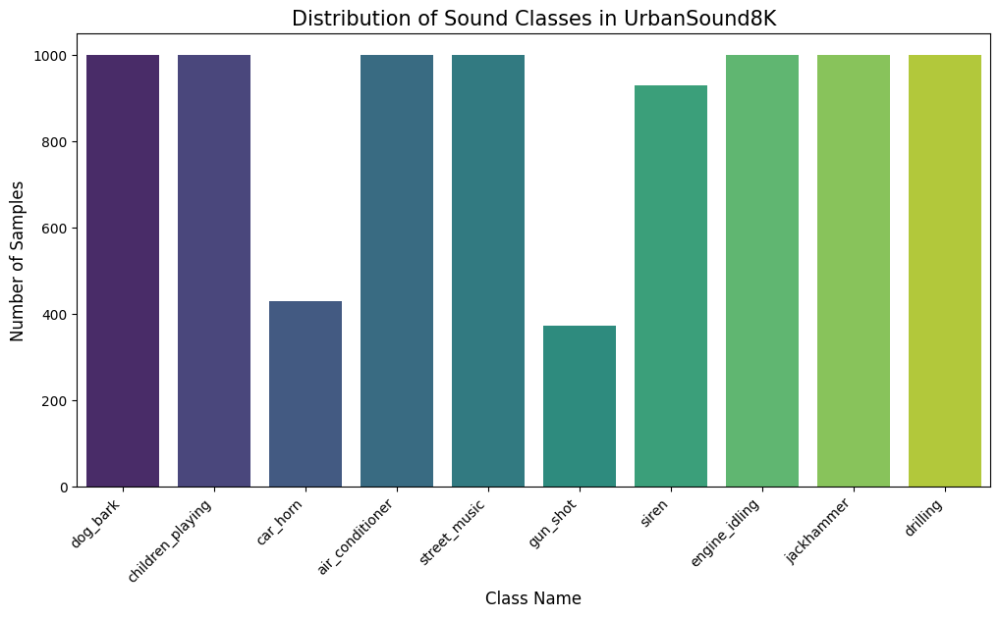

In [6]:
plt.figure(figsize=(12, 6))
sns.countplot(data=metadata_df, x='class', palette='viridis')

plt.title('Distribution of Sound Classes in UrbanSound8K', fontsize=15)
plt.xlabel('Class Name', fontsize=12)
plt.ylabel('Number of Samples', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.show()

While the visualization provides a **qualitative overview**, we must **inspect the exact sample counts** to quantify the **degree of imbalance**. This step allows us to identify **exactly how many samples are available for the minority classes** compared to the majority ones.

In [7]:
print("Exact counts per class:")
print(metadata_df['class'].value_counts())

Exact counts per class:
class
dog_bark            1000
children_playing    1000
air_conditioner     1000
street_music        1000
engine_idling       1000
jackhammer          1000
drilling            1000
siren                929
car_horn             429
gun_shot             374
Name: count, dtype: int64


The visualization **highlights key characteristics** regarding the dataset's balance:

- **General Balance:** The dataset is **predominantly balanced**, with **7 out of 10 classes** containing exactly **1,000 samples** each. Additionally, the *siren* class is very close to this threshold **(929 samples)**. This structure is **advantageous** for training deep learning models, as it **mitigates the risk of the network overfitting** to dominant classes.

- **Minority Classes:** There are two notable exceptions with **significantly fewer samples**:

    - ***car_horn*: 429 samples**
    
    - ***gun_shot*: 374 samples**


While not critically imbalanced, these two classes have less than half the data of the others. During the **Evaluation** phase, we must pay **close attention** to the specific performance metrics for these categories, as the **model may find them more challenging to generalize**.

### **Fold Distribution Analysis**

Given the strict requirement for a **10-fold cross-validation** scheme, it is **essential to verify the sample distribution across folds**.

Ideally, the **dataset should be uniformly partitioned**, with each fold containing **approximately 873 samples** (8,732/10). This **uniformity ensures that every training and testing iteration is consistent and comparable**.

C:\Users\pedro\AppData\Local\Temp\ipykernel_28008\2323061245.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=metadata_df, x='fold', palette='magma')


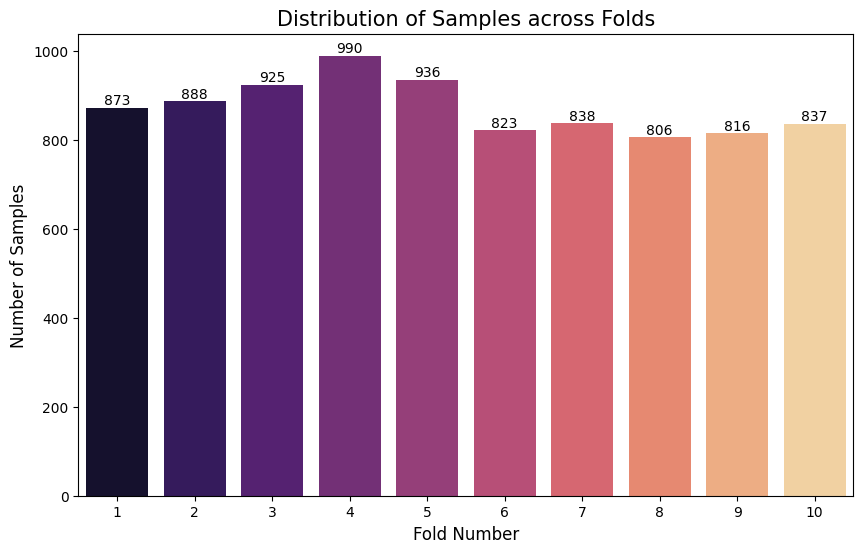

In [8]:
plt.figure(figsize=(10, 6))

ax = sns.countplot(data=metadata_df, x='fold', palette='magma')

plt.title('Distribution of Samples across Folds', fontsize=15)
plt.xlabel('Fold Number', fontsize=12)
plt.ylabel('Number of Samples', fontsize=12)

for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.show()

The **total number of samples per fold is relatively consistent**, ranging from a minimum of **806 samples (Fold 8)** to a maximum of **990 samples (Fold 4)**, with an **average of approximately 873**.

This variance is an **expected outcome of the dataset's partitioning strategy**. Since **all slices from a single long recording must remain in the same fold to prevent data leakage**, it is impossible to split the data into perfectly equal arithmetic subsets

### **Class Distribution per Fold Analysis**

Beyond global balance, it is necessary to **examine the local class distribution within each individual fold**.

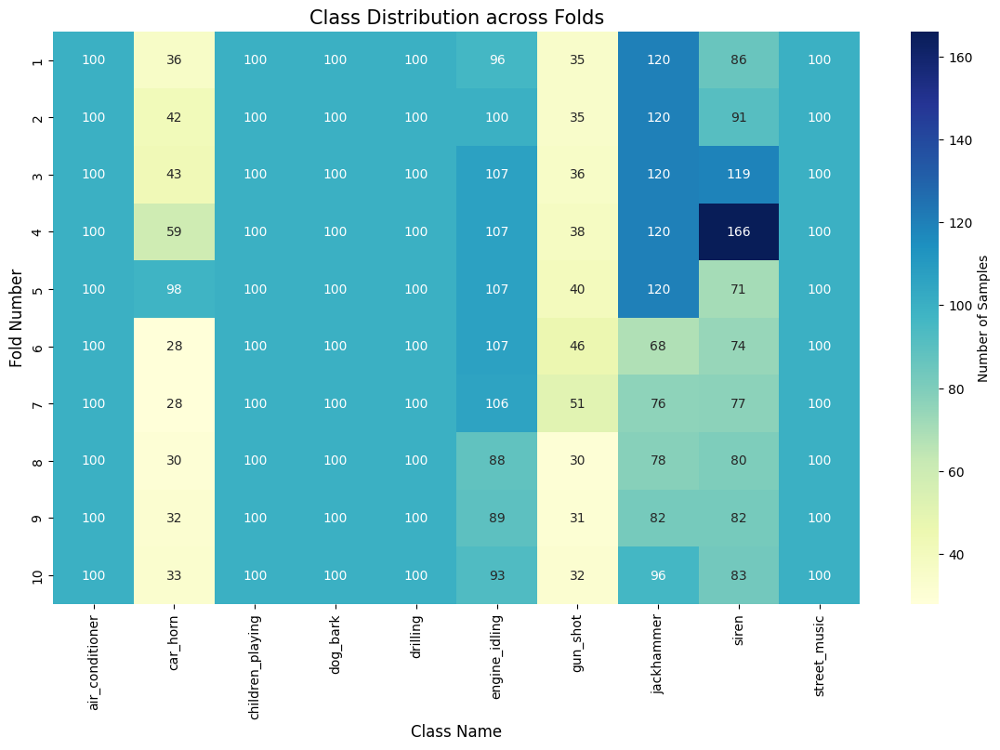

In [9]:
fold_class_dist = pd.crosstab(metadata_df['fold'], metadata_df['class'])

plt.figure(figsize=(14, 8))
sns.heatmap(fold_class_dist, annot=True, fmt='d', cmap='YlGnBu', cbar_kws={'label': 'Number of Samples'})

plt.title('Class Distribution across Folds', fontsize=15)
plt.xlabel('Class Name', fontsize=12)
plt.ylabel('Fold Number', fontsize=12)

plt.show()

Synthesizing the **total sample counts with the heatmap**, we can draw **two critical insights** regarding the cross-validation structure:

- **1. Intraclass Consistency:**

The heatmap reveals a deliberate **structural pattern** for the majority classes. Classes such as *air_conditioner*, *children_playing*, *dog_bark*, *drilling*, and *street_music* show exactly **100 samples** in every fold. This indicates a **controlled distribution for classes where data was abundant**.

- **2. Irregularities:**

We observe **significant variance in specific classes**, confirming the imapct of the dataset creation strategy (grouping by original recording source)

- **Consistent Minority:** *gun_shot* is the only class that **remains consistently low across all folds** (~30-40 samples), reflecting a global scarcity of data.

- **Local Concentrations:**

    - **Siren:** Displays a **disproportionate concentration** in **Fold 4** (166 samples) compared to the average (~80).
    - **Car Horn:** While generally a minority class (~35 samples), it exhibits a **significant spike in Fold 5** (98 samples).
    - **Jackhammer:** Shows **high variance**, dropping significantly in Folds 6 through 9 (~70 samples) compared to Folds 1 through 5 (120 samples).

**Conclusion:**
These irregularities are **expected** and **structural**. As detailed in the methodology, the dataset is partitioned based on the *original recording source* to prevent data leakage. The **observed spikes** (e.g., Siren in Fold 4, Car Horn in Fold 5) indicate that specific long recordings containing many slices ended up in those specific folds. We must **proceed with this fixed structure to ensure scientific validity**.

### **Salience Analysis**

The dataset **features a subjective rating called *salience***, which indicates the **prominence of the sound event within the recording**:

- **1 (Foreground):** The sound is **clear and prominent**.

- **2 (Background):** The sound is **distant or mixed with other noise**.

Analyzing this distribution helps us understand the quality of the data.

C:\Users\pedro\AppData\Local\Temp\ipykernel_28008\703311257.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=metadata_df, x='salience', palette='coolwarm')


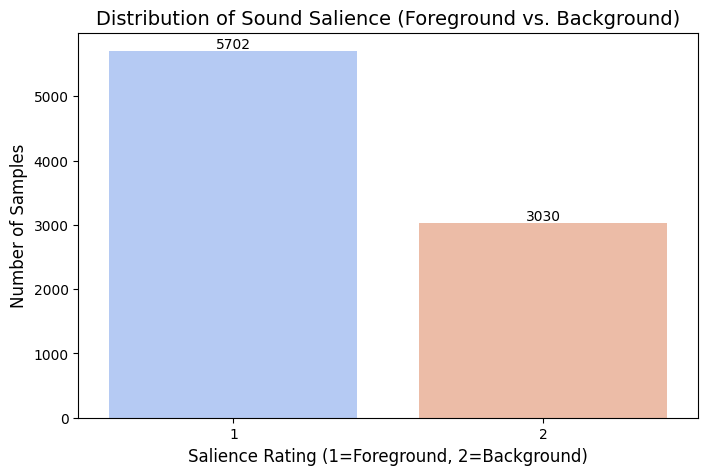

In [10]:
plt.figure(figsize=(8, 5))
ax = sns.countplot(data=metadata_df, x='salience', palette='coolwarm')


plt.title('Distribution of Sound Salience (Foreground vs. Background)', fontsize=14)
plt.xlabel('Salience Rating (1=Foreground, 2=Background)', fontsize=12)
plt.ylabel('Number of Samples', fontsize=12)

for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.show()

In [11]:
# Calculate and print percentages of foreground and background sounds
salience_counts = metadata_df['salience'].value_counts()
print(f"\nForeground (1): {salience_counts[1] / len(metadata_df) * 100:.1f}%")
print(f"Background (2): {salience_counts[2] / len(metadata_df) * 100:.1f}%")


Foreground (1): 65.3%
Background (2): 34.7%


The data reveals that **34.7%** of the dataset consists of **Background** (salience=2) recordings. This distribution has **a critical implication** for the project:

- **Robustness:** The **inclusion of noisy or distant sounds** forces the neural network to **learn more robust features** invariant to distance and noise, **simulating real-world conditions**.

### **Background Distribution by Class**

To **forecast potential performance issues** during the **Evaluation** phase, we **break down the *salience=2* (Background) samples by class**.

Classes with a **higher proportion of "Background" samples contain more noise and less distinct features**. Consequently, the model may **struggle** more to classify these categories correctly **compared to those dominated by "Foreground" samples**. This hypothesis will be **empirically validated or refuted** during the **Evaluation** phase.

C:\Users\pedro\AppData\Local\Temp\ipykernel_28008\1079593241.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=background_samples, x='class', palette='crest')


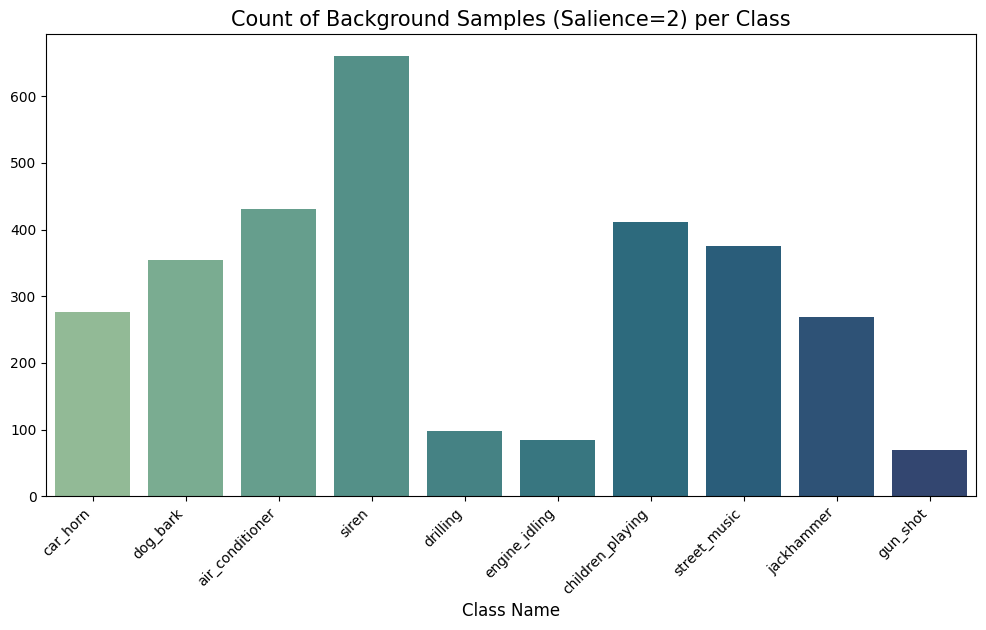

In [12]:
background_samples = metadata_df[metadata_df['salience'] == 2]


plt.figure(figsize=(12, 6))
sns.countplot(data=background_samples, x='class', palette='crest')

plt.title('Count of Background Samples (Salience=2) per Class', fontsize=15)
plt.xlabel('Class Name', fontsize=12)
plt.ylabel('')
plt.xticks(rotation=45, ha='right')

plt.show()

To **understand the difficulty of the classification task for each category**, we will normalize the **background counts by the total number of samples per class**.

This **metric (Background %) serves as a representative for the "Noise Complexity" of each class**. Classes with a **high percentage of background samples** will **likely result in lower validation accuracy** due to the lack of clear, foreground acoustic features.

In [13]:
total_counts = metadata_df['class'].value_counts()
bg_counts = background_samples['class'].value_counts()

quality_stats = pd.DataFrame({
    'Total Samples': total_counts,
    'Background Samples': bg_counts
})

quality_stats['Background (%)'] = (quality_stats['Background Samples'] / quality_stats['Total Samples'] * 100).round(2)

quality_stats = quality_stats.fillna(0)

print("Classes sorted by percentage of Background noise:")
display(quality_stats.sort_values(by='Background (%)', ascending=False))

Classes sorted by percentage of Background noise:


,Total Samples,Background Samples,Background (%)
class,,,
siren,929,660,71.04
car_horn,429,276,64.34
air_conditioner,1000,431,43.10
children_playing,1000,412,41.20
street_music,1000,375,37.50
dog_bark,1000,355,35.50
jackhammer,1000,269,26.90
gun_shot,374,70,18.72
drilling,1000,98,9.80


The **quantitative analysis of the *salience* attribute provides critical insights into the data quality of each class**, revealing **three distinct clusters**:

- **High-Noise Classes (> 60% Background):**
**Siren** (71.04%) and **car_horn** (64.34%) are the classes **most affected by background noise**.
The **majority of these samples correspond to distant sounds mixed with city noise**. This makes the **classification task significantly harder** for these categories, as the **model must learn to filter out heavy environmental noise to detect the core features**.
The **car_horn** class is now identified as the **most problematic in the entire dataset**. It suffers from a **"double penalty"**: it has the **second lowest sample count** (429) and the **second highest noise ratio** (64%).

- **Moderate Noise Classes (35% - 45%):**
Classes like **air_conditioner**, **children_playing**, and **street_music** **sit in the middle range**. While they have a significant amount of background noise, it is not as dominant as observed in sirens or car_horns.

- **High-Quality Classes (< 10% Background):**
On the other end, **drilling** (9.8%) and **engine_idling** (8.4%) are **exceptionally clean**, consisting almost entirely of foreground recordings. We expect the model to achieve **higher accuracy** on these specific classes **due to the clarity of the signal**.

**Conclusion:**
This **distribution suggests that our model's performance will likely be uneven**. We anticipate high metrics for *drilling* and *engine_idling*, but potential struggles with *siren* and *car_horn*.

### **Background Distribution by Folder**

To assess the **consistency of data quality across the cross-validation splits**, we examine the **ratio of foreground to background samples within each fold**.

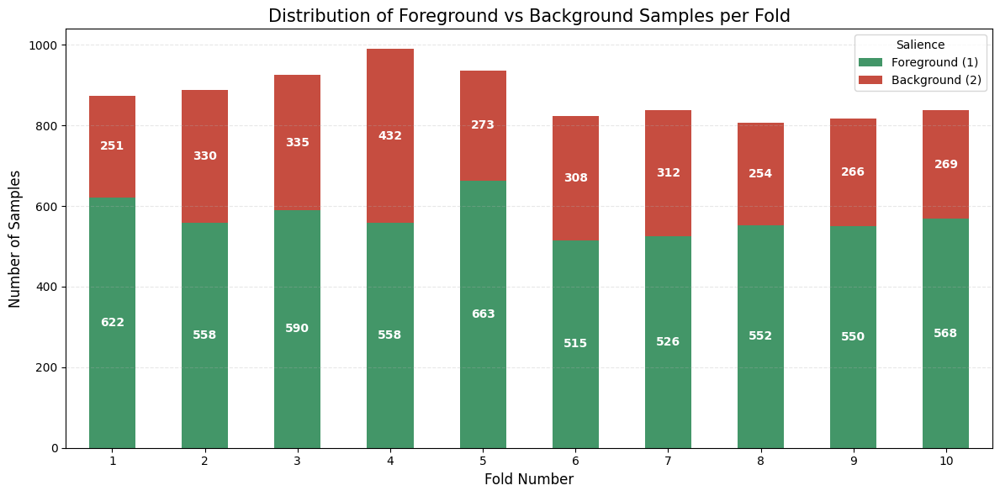

Percentage of Background Noise per Fold:


,Foreground (1),Background (2)
fold,,
1,71.25,28.75
2,62.84,37.16
3,63.78,36.22
4,56.36,43.64
5,70.83,29.17
6,62.58,37.42
7,62.77,37.23
8,68.49,31.51
9,67.40,32.60


In [14]:
fold_salience_dist = pd.crosstab(metadata_df['fold'], metadata_df['salience'])

fold_salience_dist.columns = ['Foreground (1)', 'Background (2)']

fold_salience_pct = fold_salience_dist.div(fold_salience_dist.sum(1), axis=0) * 100

ax = fold_salience_dist.plot(kind='bar', stacked=True, figsize=(12, 6), 
                             color=['#2E8B57', '#C0392B'], alpha=0.9)

plt.title('Distribution of Foreground vs Background Samples per Fold', fontsize=15)
plt.xlabel('Fold Number', fontsize=12)
plt.ylabel('Number of Samples', fontsize=12)
plt.xticks(rotation=0)
plt.legend(title='Salience', loc='upper right')

for c in ax.containers:
    ax.bar_label(c, label_type='center', color='white', weight='bold')

plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

print("Percentage of Background Noise per Fold:")
display(fold_salience_pct.round(2))

We can observe a **consistent pattern in all partitions**: **every fold is predominantly composed of Foreground sounds**. Although the **exact proportion varies slightly**, the distinct **"clean" sounds always constitute the majority** of the data compared to the background/noisy samples. This consistency ensures that the **model is primarily trained on clear features across all cross-validation steps**.

## **Audio Data Analysis**

Following the metadata quality assessment, the analysis proceeds to the **inspection of the raw audio signals**.

This step is critical to **understand the input data destined for the Deep Learning models**.

We will select samples from all classes to:

1.  **Auditory Inspection:** **Listening** to the clips.

2.  **Time-Domain Analysis (Waveform):** **Visualizing amplitude** over time to detect silence or continuous noise.

3.  **Frequency-Domain Analysis (Mel-Spectrogram):** **Visualizing frequency intensity over time**. This **2D representation** is particularly important as it serves as the standard input for **Convolutional Neural Networks (CNNs)**, treating audio classification effectively as an image recognition task.

4.  **Feature Extraction (MFCCs):** Visualizing **Mel-Frequency Cepstral Coefficients**.

### **Feature Explanation**

Prior to visualization, it is **essential to understand the two primary frequency** representations utilized as **inputs for our Deep Learning models**, as suggested in the project literature.

**Mel-Spectrogram:** Visual representation of the signal´s frequency spectrum as it varies over time.

- **Y-Axis (Mel Scale):** Unlike a standard linear spectrogram (Hz), this utilizes the **Mel Scale**, which **mimics human hearing (higher sensitivity to differences in lower frequencies)**.
- **Intensity (Color):** Represents the **loudness (amplitude) in decibels (dB)**.

**MFCCs (Mel-Frequency Cepstral Coefficients):** Compressed decorrelated representation from the Mel-Spectrogram.

- It **applies a Discrete Cosine Transform (DCT) to the log-Mel-Spectrogram** to extract the **general shape of the sound while discarding fine details (pitch information)**.
- Typically results in a **smaller matrix of 13 to 40 coefficients**. While computationally efficient, it **discards some information preserved in the full Mel-Spectrogram**

### **Foreground Samples Analysis**

The **analysis starts with an auditory and visual inspection of representative samples from each class**.

To characterize the **"ideal" signal** for each category, the selection filter prioritizes **Foreground (Salience=1) clips** with the **maximum available duration (4 seconds)**. This allows us to observe the **complete temporal and spectral structure of the sound** events without significant truncation.

CLASS 1/10: AIR_CONDITIONER | File: 185709-0-0-8.wav | Duration: 4.00s


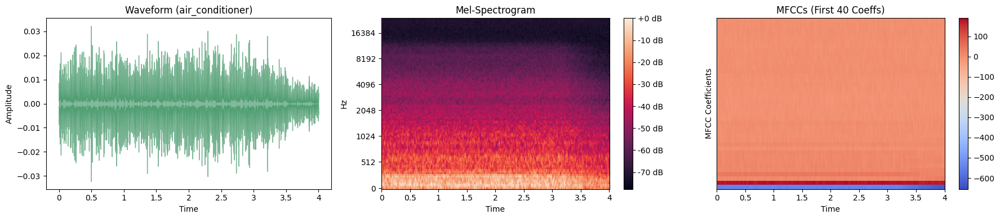

CLASS 2/10: CAR_HORN | File: 24074-1-0-7.wav | Duration: 4.00s


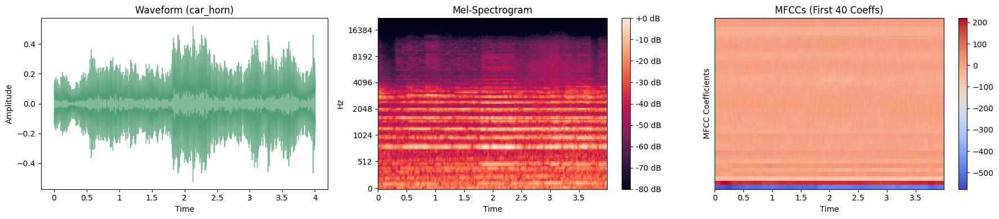

CLASS 3/10: CHILDREN_PLAYING | File: 6902-2-0-4.wav | Duration: 4.00s


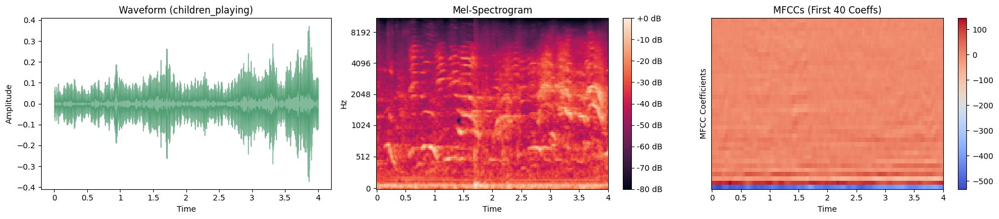

CLASS 4/10: DOG_BARK | File: 52441-3-0-0.wav | Duration: 4.00s


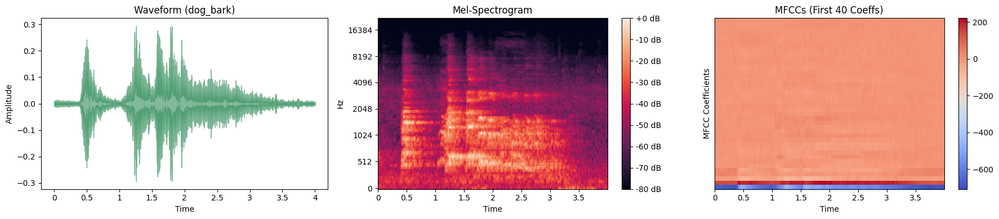

CLASS 5/10: DRILLING | File: 58937-4-0-2.wav | Duration: 4.00s


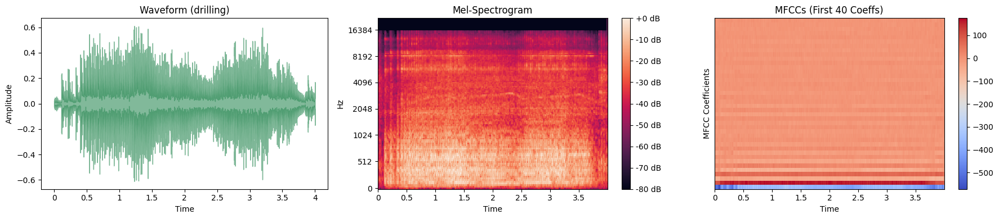

CLASS 6/10: ENGINE_IDLING | File: 176638-5-0-2.wav | Duration: 4.00s


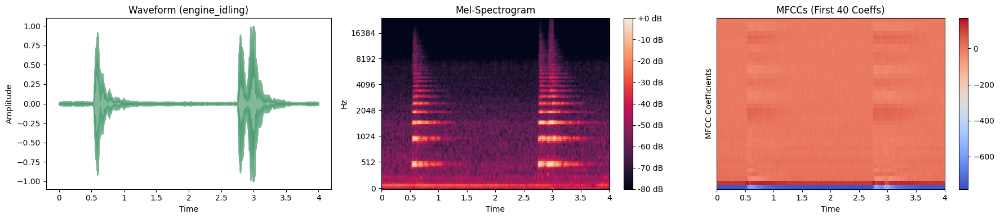

CLASS 7/10: GUN_SHOT | File: 35800-6-0-0.wav | Duration: 4.00s


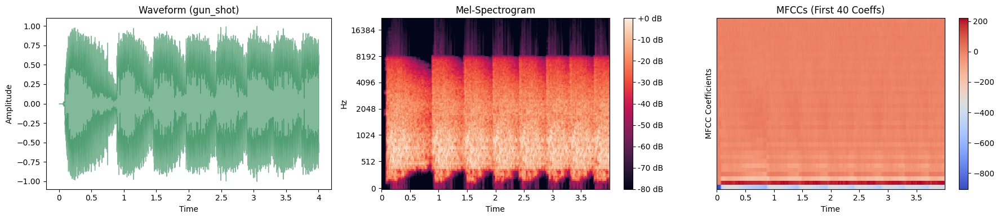

CLASS 8/10: JACKHAMMER | File: 131918-7-0-4.wav | Duration: 4.00s


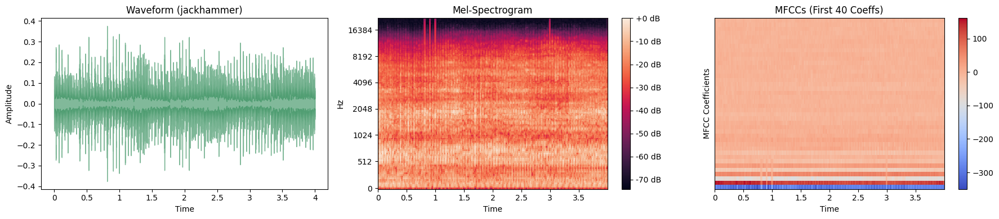

CLASS 9/10: SIREN | File: 157868-8-0-23.wav | Duration: 4.00s


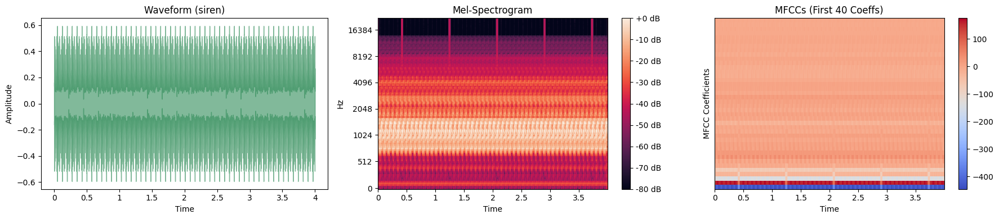

CLASS 10/10: STREET_MUSIC | File: 42953-9-0-21.wav | Duration: 4.00s


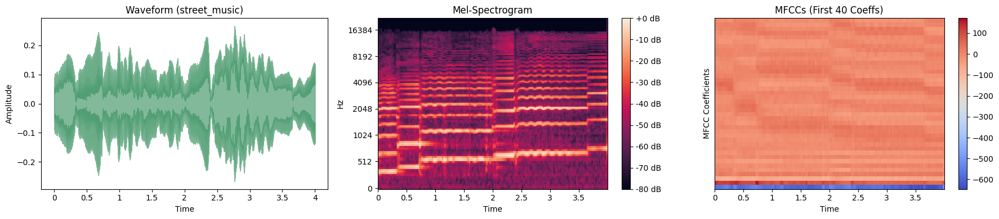

In [15]:
classes = sorted(metadata_df['class'].unique())
n_mfcc = 40

for i, label in enumerate(classes):
    class_samples = metadata_df[
        (metadata_df['class'] == label) & 
        (metadata_df['salience'] == 1) & 
        (metadata_df['duration'] >= 4.0)
    ]
    
    if len(class_samples) == 0:
        print(f"Note: No full-length foreground sample for {label}. Using any foreground sample.")
        class_samples = metadata_df[(metadata_df['class'] == label) & (metadata_df['salience'] == 1)]
    
    sample = class_samples.sample(1).iloc[0]

    filename = sample['slice_file_name']
    fold = sample['fold']
    file_path = os.path.join('UrbanSound8K', 'audio', f'fold{fold}', filename)
    
    y, sr = librosa.load(file_path, sr=None)
    
    print(f"CLASS {i+1}/10: {label.upper()} | File: {filename} | Duration: {len(y)/sr:.2f}s")

    display(ipd.Audio(file_path))
    
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
    S_dB = librosa.power_to_db(S, ref=np.max)
    
    mfccs = librosa.feature.mfcc(S=S_dB, n_mfcc=n_mfcc)
    
    plt.figure(figsize=(18, 4))
    
    # Plot A: Waveform
    plt.subplot(1, 3, 1)
    librosa.display.waveshow(y, sr=sr, color='#2E8B57', alpha=0.6)
    plt.title(f'Waveform ({label})')
    plt.ylabel('Amplitude')
    plt.xlabel('Time')
    
    # Plot B: Mel-Spectrogram
    plt.subplot(1, 3, 2)
    librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel', cmap='rocket')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel-Spectrogram')
    
    # Plot C: MFCCs
    plt.subplot(1, 3, 3)
    librosa.display.specshow(mfccs, sr=sr, x_axis='time', cmap='coolwarm')
    plt.colorbar()
    plt.title(f'MFCCs (First {n_mfcc} Coeffs)')
    plt.ylabel('MFCC Coefficients')
    
    plt.tight_layout()
    plt.show()

### **Comparison between Foreground and Background Samples**

To **contextualize the classification challenge**, we perform a **comparative analysis** between **Foreground** (Salience 1) and **Background** (Salience 2) samples from the same class.

For this analysis, we focus on the classes **siren** and **car_horn**, as these categories **exhibited the majority of samples classified as background sounds**.

#### **Comparison - Siren**

To **empirically demonstrate the "Background Noise" challenge**, we **isolate two distinct samples** from the Siren class: **one labeled as Foreground** and **one as Background**.

We specifically **listen to the audios** and **visualize the Waveform, Mel-Spectrogram, and MFCCs side-by-side to observe how environmental noise degrades the feature quality**.

Analyzing Challenge for Class: SIREN

--- Foreground (Clean) ---
File: 71177-8-1-0.wav (Fold 8)



--- Background (Noisy) ---
File: 24347-8-0-24.wav (Fold 4)


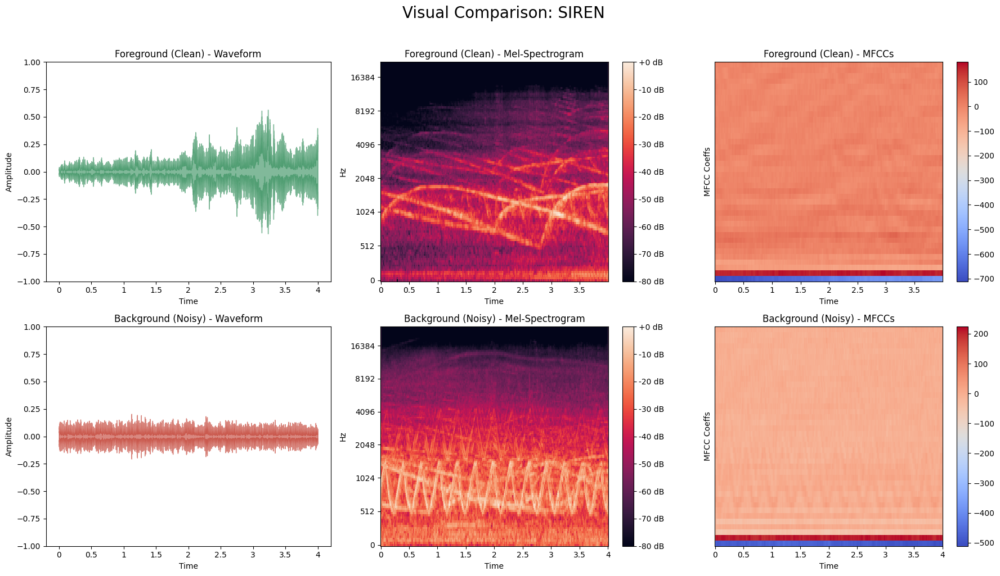

In [16]:
selected_class = 'siren'
print(f"Analyzing Challenge for Class: {selected_class.upper()}")

fg_sample = metadata_df[metadata_df['slice_file_name'] == '71177-8-1-0.wav'].iloc[0]
bg_sample = metadata_df[metadata_df['slice_file_name'] == '24347-8-0-24.wav'].iloc[0]

samples = [
    {'title': 'Foreground (Clean)', 'data': fg_sample, 'color': '#2E8B57'},
    {'title': 'Background (Noisy)', 'data': bg_sample, 'color': '#C0392B'}  
]

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle(f'Visual Comparison: {selected_class.upper()}', fontsize=20, y=1.02)

for i, info in enumerate(samples):
    sample_data = info['data']
    file_path = os.path.join('UrbanSound8K', 'audio', f"fold{sample_data['fold']}", sample_data['slice_file_name'])
    
    y, sr = librosa.load(file_path, sr=None)
    
    print(f"\n--- {info['title']} ---")
    print(f"File: {sample_data['slice_file_name']} (Fold {sample_data['fold']})")
    display(ipd.Audio(file_path))
    
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
    S_dB = librosa.power_to_db(S, ref=np.max)
    mfccs = librosa.feature.mfcc(S=S_dB, n_mfcc=40)

    librosa.display.waveshow(y, sr=sr, alpha=0.6, color=info['color'], ax=axes[i, 0])
    axes[i, 0].set_title(f"{info['title']} - Waveform")
    axes[i, 0].set_ylabel('Amplitude')
    axes[i, 0].set_ylim([-1, 1])

    img_mel = librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel', cmap='rocket', ax=axes[i, 1])
    fig.colorbar(img_mel, ax=axes[i, 1], format='%+2.0f dB')
    axes[i, 1].set_title(f"{info['title']} - Mel-Spectrogram")

    img_mfcc = librosa.display.specshow(mfccs, sr=sr, x_axis='time', cmap='coolwarm', ax=axes[i, 2])
    fig.colorbar(img_mfcc, ax=axes[i, 2])
    axes[i, 2].set_title(f"{info['title']} - MFCCs")
    axes[i, 2].set_ylabel('MFCC Coeffs')

plt.tight_layout()
plt.show()

The comparative visualization confirms the **severity of the noise challenge**:

**Waveform Analysis (Time Domain):**
- **Foreground (Top):** The signal is dynamic and clean. We can clearly see the **distinct pulses of the siren, with periods of lower amplitude** (silence) in between.
- **Background (Bottom):** The waveform appears as a **dense "block"** or "brick" of **constant amplitude**. This indicates a high **noise floor**.

**Mel-Spectrogram Analysis (Frequency Domain):**
- **Foreground:** The **visual features are sharp**. We see clear, bright **"sweeping curves" (harmonic lines)** against a dark background. These curves represent the **siren's pitch rising and falling**.
- **Background:** The distinct harmoic curves are **masked under a texture of orange/purple static**. The sharp lines are blurred, and the **contrast is low**.

While a **human listener still isolate the siren** in the background clip, a **Deep Learning Model faces a significant challenge**.

#### **Comparison - Car_Horn**

Following the analysis of the Siren, we **examine the Car Horn class**. This comparison reveals a **different but equally critical set of spectral challenges**.

While the **Siren is characterized by modulation (pitch change)**, the **Car Horn is typically defined by harmonic stability**. We investigate how this stability is compromised in background recordings

Analyzing Challenge for Class: CAR_HORN

--- Foreground (Clean) ---
File: 54187-1-0-2.wav (Fold 9)



--- Background (Noisy) ---
File: 72259-1-0-3.wav (Fold 5)


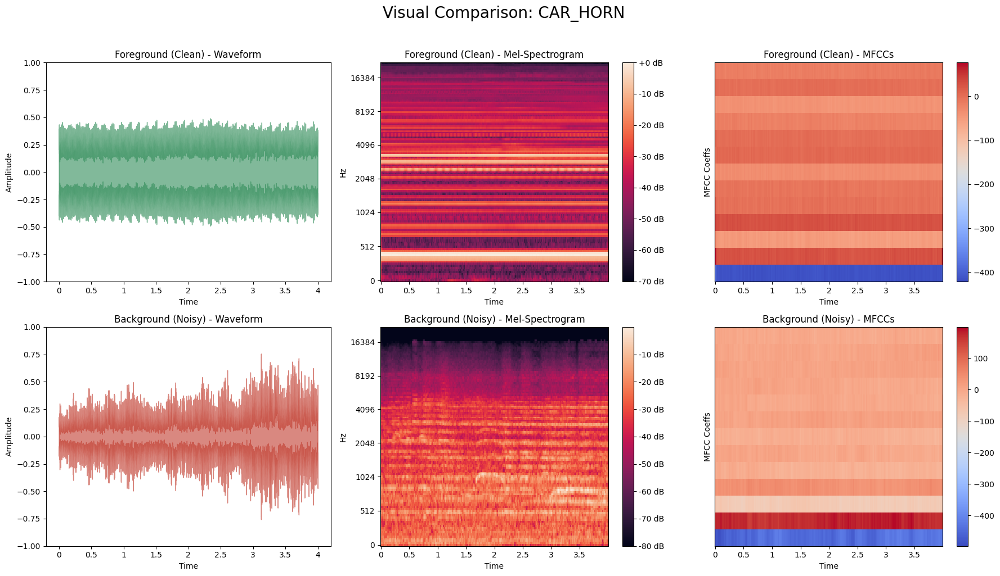

In [17]:
selected_class = 'car_horn'
print(f"Analyzing Challenge for Class: {selected_class.upper()}")

fg_sample = metadata_df[metadata_df['slice_file_name'] == '54187-1-0-2.wav'].iloc[0]
bg_sample = metadata_df[metadata_df['slice_file_name'] == '72259-1-0-3.wav'].iloc[0]

samples = [
    {'title': 'Foreground (Clean)', 'data': fg_sample, 'color': '#2E8B57'},
    {'title': 'Background (Noisy)', 'data': bg_sample, 'color': '#C0392B'} 
]

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle(f'Visual Comparison: {selected_class.upper()}', fontsize=20, y=1.02)

for i, info in enumerate(samples):
    sample_data = info['data']
    file_path = os.path.join('UrbanSound8K', 'audio', f"fold{sample_data['fold']}", sample_data['slice_file_name'])
    
    y, sr = librosa.load(file_path, sr=None)
    
    print(f"\n--- {info['title']} ---")
    print(f"File: {sample_data['slice_file_name']} (Fold {sample_data['fold']})")
    display(ipd.Audio(file_path))

    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
    S_dB = librosa.power_to_db(S, ref=np.max)
    mfccs = librosa.feature.mfcc(S=S_dB, n_mfcc=13)

    librosa.display.waveshow(y, sr=sr, alpha=0.6, color=info['color'], ax=axes[i, 0])
    axes[i, 0].set_title(f"{info['title']} - Waveform")
    axes[i, 0].set_ylabel('Amplitude')
    axes[i, 0].set_ylim([-1, 1])

    img_mel = librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel', cmap='rocket', ax=axes[i, 1])
    fig.colorbar(img_mel, ax=axes[i, 1], format='%+2.0f dB')
    axes[i, 1].set_title(f"{info['title']} - Mel-Spectrogram")

    img_mfcc = librosa.display.specshow(mfccs, sr=sr, x_axis='time', cmap='coolwarm', ax=axes[i, 2])
    fig.colorbar(img_mfcc, ax=axes[i, 2])
    axes[i, 2].set_title(f"{info['title']} - MFCCs")
    axes[i, 2].set_ylabel('MFCC Coeffs')

plt.tight_layout()
plt.show()

The comparison highlights the **vulnerability of tonal sounds to environmental noise:**

**Waveform Analysis (Time Domain):**
- **Foreground (Top):** The waveform presents as a **solid, consistent block** of high amplitude. This represents a **sustained, continuous horn blast without interruption**. The signal is **dense and uniform**.
- **Background (Bottom):** The signal **loses its continuity**. Instead of a sustained tone, we see **varying amplitude levels and irregular peaks**. This suggests the horn sound is distant and heavily mixed with other fluctuating urban sounds, **losing its "constant" temporal characteristic.**

**Mel-Spectrogram Analysis (Frequency Domain):**
- **Foreground:** The distinction here is striking. We see **clear, bright horizontal lines** stacked on top of each other. These are the **harmonics** of the car horn. It is a **tonal sound with a stable pitch**, creating a very structured "ladder" pattern.
- **Background:** The **harmonic structure is almost completely obliterated**. The distinct horizontal lines are replaced by a **broadband wash of orange/red noise**, particularly in the lower frequencies, losing the structure.

For the *car_horn* class, the challenge in **Background (Salience=2)** samples is the **loss of the "Harmonic Stack"**. Traffic noise often occupies the **same frequency bands as the car horn**. A model trained primarily on clean data may struggle to extract these faint harmonic traces from the noise floor.

# <center> **Data Preparation**

In this next phase, we will **focus on transforming the raw audio files into a standardized format** turning them suitable for training Deep Learning models.

Raw audio data inherently contains **variations in sampling rates, channel counts (mono vs. stereo), and durations**.

This **signal processing step is a must for the subsequent feature extraction stage**, where we will **generate the representations** that the models will actually learn from.

## **Analysis of Original Sample Rates**

Prior to standardization, the **distribution of original sample rates** across the raw audio files is analyzed to confirm the necessity of a **dedicated resampling step**. This inspection verifies the **heterogeneity in the dataset**, as noted in the project guidelines.

Scanning dataset for sample rates...
Scanned 1000 files...
Scanned 2000 files...
Scanned 3000 files...
Scanned 4000 files...
Scanned 5000 files...
Scanned 6000 files...
Scanned 7000 files...
Scanned 8000 files...


C:\Users\pedro\AppData\Local\Temp\ipykernel_28008\3269665742.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='sample_rate', data=sr_df, palette='viridis')


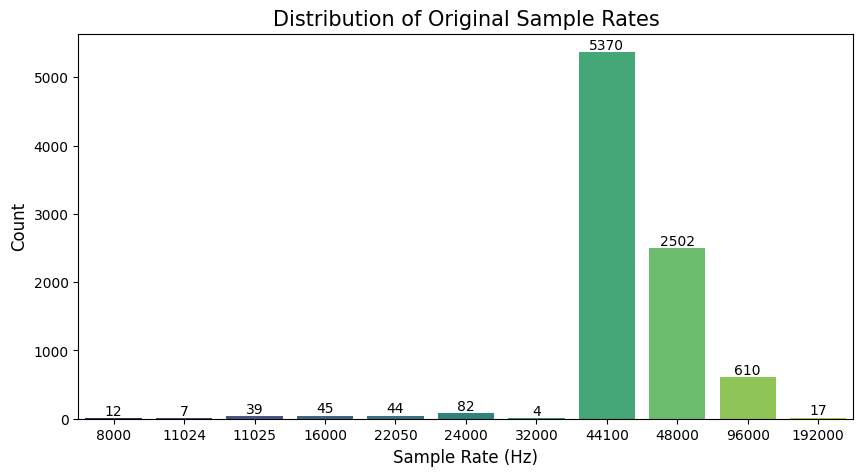

In [18]:
print("Scanning dataset for sample rates...")

sample_rates = []

for index, row in metadata_df.iterrows():
    file_path = os.path.join('UrbanSound8K', 'audio', f"fold{row['fold']}", row['slice_file_name'])
    
    try:
        sr = librosa.get_samplerate(file_path)
        sample_rates.append(sr)
    except:
        continue
        
    if (index + 1) % 1000 == 0:
        print(f"Scanned {index + 1} files...")


sr_df = pd.DataFrame(sample_rates, columns=['sample_rate'])

plt.figure(figsize=(10, 5))
sns.countplot(x='sample_rate', data=sr_df, palette='viridis')
plt.title('Distribution of Original Sample Rates', fontsize=15)
plt.xlabel('Sample Rate (Hz)', fontsize=12)
plt.ylabel('Count', fontsize=12)

for p in plt.gca().patches:
    plt.gca().annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.show()

Following the analysis of the original sample rates, we decided to **convert all audio files** to a consistent sampling rate of **44,100 Hz**.

We are resampling to keep an **Input Uniformity:**
- Deep Learning models **require input tensors of a fixed size**. Since the *UrbanSound8K* dataset aggregates recordings from various sources, the **files possess mixed native sampling rates**. We **cannot train a model with mixed time resolutions, therefore, standardization is mandatory**.

We chose to use the value sampling rate of 44,100 Hz to **Preserve Signal Integrity:**
- **Data Integrity:** As shown in our data analysis, **~61% of the dataset (5,370 files) is natively recorded at 44.1 kHz**. By choosing this rate, we **avoid resampling the majority of our data**, preventing the introduction of interpolation errors in the bulk of the training set.
- **Safe Downsampling:** The second largest group consists of ~29% of the files recorded at 48 kHz (2,502 files) and 96 kHz. **Downsampling these high-resolution files to 44.1 kHz preserves their signal quality**.
- **Full Spectral Coverage**: According to the **Nyquist theorem, 44.1 kHz captures frequencies up to ~22,050 Hz, covering the entire human hearing range**. This ensures we **preserve critical high-frequency harmonics** found in urban sounds (e.g., sirens, jackhammers).

## **Audio Channel Conversion**

Besides the sample rate, another **crucial dimension of audio data is the number of channels**. Audio files can be **Mono (1 channel) or Stereo (2 channels)**.

Deep Learning models generally require a **fixed input depth**. Therefore, we must **analyze the distribution of channels** in the UrbanSound8K dataset to decide on a **unification strategy**.

Scanning file channels...
Scanned 1000 files...
Scanned 2000 files...
Scanned 3000 files...
Scanned 4000 files...
Scanned 5000 files...
Scanned 6000 files...
Scanned 7000 files...
Scanned 8000 files...


C:\Users\pedro\AppData\Local\Temp\ipykernel_28008\3452560716.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='channels', data=df_channels, palette='pastel')


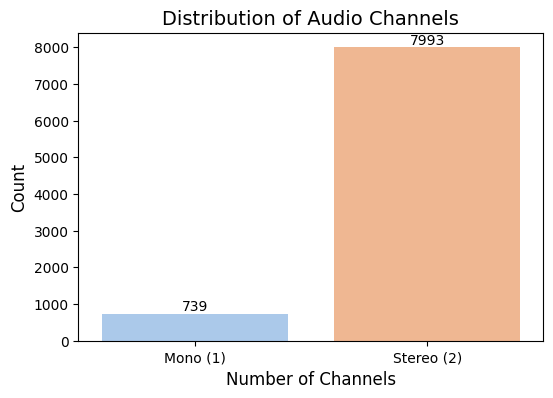

In [19]:
channels_count = []

print("Scanning file channels...")

for index, row in metadata_df.iterrows():
    file_path = os.path.join('UrbanSound8K', 'audio', f"fold{row['fold']}", row['slice_file_name'])
    
    try:
        info = sf.info(file_path)
        channels_count.append(info.channels)
    except Exception as e:
        print(f"Error reading {row['slice_file_name']}: {e}")
        continue
        
    if (index + 1) % 1000 == 0:
        print(f"Scanned {index + 1} files...")

df_channels = pd.DataFrame(channels_count, columns=['channels'])

plt.figure(figsize=(6, 4))
ax = sns.countplot(x='channels', data=df_channels, palette='pastel')

plt.title('Distribution of Audio Channels', fontsize=14)
plt.xlabel('Number of Channels', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks([0, 1], ['Mono (1)', 'Stereo (2)']) # Ajustar labels se necessário

for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.show()

Our analysis reveals a **massive imbalance in channel distribution**: **~91.5% of the files are Stereo (7,993 files)**, while only **~8.5% are Mono (739 files)**.

Despite the prevalence of Stereo files, we have decided to **convert the entire dataset to Mono (1 Channel)** due to two main reasons:
- **Feature Invariance:** In Urban Sound Classification, the **goal is to identify the source of the sound** (e.g., "Air Conditioner" vs. "Car Horn"). The **spatial location of the source** (left vs. right channel) **is irrelevant to the class identity**. By mixing down to mono, we focus the model solely on the spectral characteristics of the sound.

- **Computational Efficiency:** Stereo audio contains two channels of data. Using **stereo inputs would double the dimensionality of our input tensors**. Converting to mono reduces the memory footprint by 50%, allowing for faster training times without sacrificing classification accuracy.

## **Audio Duration Standardization**

We must verify the actual **duration of the recordings**. Although the documentation states that all excerpts are **less than 4 seconds**, knowing the **exact distribution** is vital for our **preprocessing strategy**.

**If lengths vary significantly** we might need to apply **padding** (adding silence) or **truncating** (cutting extra) to **ensure all inputs to the Neural Network have the exact same shape**.

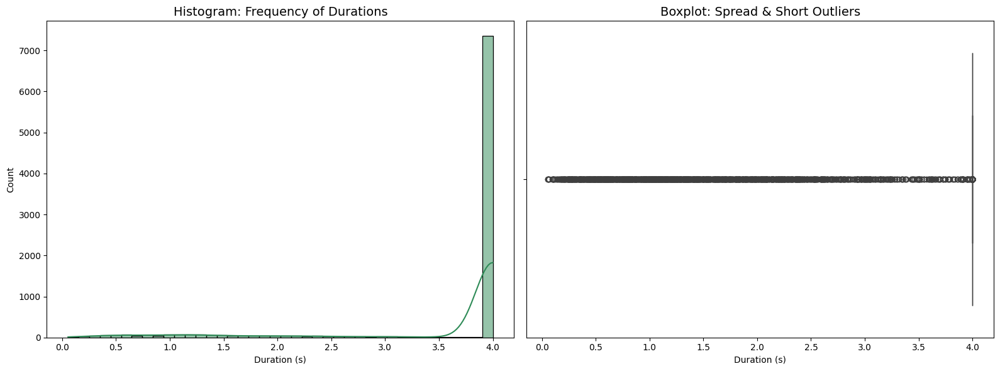

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.histplot(data=metadata_df, x='duration', bins=40, kde=True, color='#2E8B57', ax=axes[0])
axes[0].set_title('Histogram: Frequency of Durations', fontsize=14)
axes[0].set_xlabel('Duration (s)')
axes[0].set_ylabel('Count')

sns.boxplot(x=metadata_df['duration'], color='#20B2AA', ax=axes[1])
axes[1].set_title('Boxplot: Spread & Short Outliers', fontsize=14)
axes[1].set_xlabel('Duration (s)')

plt.tight_layout()
plt.show()

To ensure a better understanding we **partitioned the attribute into defined intervals** to investigate further.

In [21]:
bins = [0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 3.999999, 4.000001, 100]
labels = ['0 - 0.5s', '0.5 - 1s', '1 - 1.5s', '1.5 - 2s', '2 - 2.5s', '2.5 - 3s', '3 - 3.5s', '3.5 - <4s', 'Exactly 4s', '> 4s']

metadata_df['duration_interval'] = pd.cut(metadata_df['duration'], bins=bins, labels=labels, include_lowest=True)

duration_stats = metadata_df['duration_interval'].value_counts().sort_index().to_frame(name='Count')

total_files = len(metadata_df)
duration_stats['Percentage (%)'] = (duration_stats['Count'] / total_files * 100).round(2)


print(f"Total Files: {total_files}")
display(duration_stats)

short_count = duration_stats.loc[duration_stats.index.isin(labels[:8]), 'Count'].sum()
exact_count = duration_stats.loc['Exactly 4s', 'Count']
long_count = duration_stats.loc['> 4s', 'Count']

print(f"Need Padding (< 4s)   : {short_count} files ({(short_count/total_files*100):.2f}%)")
print(f"Ready to Use (= 4s)   : {exact_count} files ({(exact_count/total_files*100):.2f}%)")
print(f"Need Truncating (> 4s): {long_count} files ({(long_count/total_files*100):.2f}%)")

if long_count > 0:
    print("\nFound files larger than 4s")

Total Files: 8732


,Count,Percentage (%)
duration_interval,,
0 - 0.5s,166,1.90
0.5 - 1s,291,3.33
1 - 1.5s,328,3.76
1.5 - 2s,197,2.26
2 - 2.5s,172,1.97
2.5 - 3s,110,1.26
3 - 3.5s,74,0.85
3.5 - <4s,61,0.70
Exactly 4s,7333,83.98


Need Padding (< 4s)   : 1399 files (16.02%)
Ready to Use (= 4s)   : 7333 files (83.98%)
Need Truncating (> 4s): 0 files (0.00%)


During the **calculation of audio durations** (end_time - start_time), we encountered a common **computational problem** related to **Floating Point Precision** (IEEE 754 standard).

A **strict comparison** (duration > 4.0) initially flagged **263 files as being longer than 4 seconds**. After closer inspection, these files had durations such as *4.000000000000001* seconds. This occurs because the **binary representation of decimal subtraction** (e.g., *72.5 - 68.5*) can result in **infinitesimal rounding errors**.

To **accurately categorize** these files without discarding valid data, we implemented a **Binning Strategy with Tolerance**:
We defined the "Exactly 4s" bin with a **micro-tolerance range: [3.999999, 4.000001]**.
This approach correctly **grouped the 263 "floating-point error" files into the 4-second category**.

Since the **maximum duration** in the dataset is capped at **4 seconds**, we **establish 4.0 seconds as the fixed input length for our model**.

Since **no files exceed the 4-second threshold**, we **do not need to truncate** any part of the audio signals. We **preserve 100% of the original acoustic information**.

For the **16% of files shorter than 4 seconds**, we **append zeros to the end of the array (Zero Padding)**. In digital audio, a **value of 0 represents silence**.
This ensures the model treats the **added length as "absence of sound"** rather than noise or repetitive patterns, minimizing bias during training.

## **Audio Amplitude Normalization**

**Raw audio files often differ significantly in volume (loudness) and bit-depth representation** (e.g., 16-bit integers vs. 24-bit). To ensure numerical stability and model efficiency, we **must normalize the amplitude of the samples**.

Scanning audio bit-depths...
Scanned 1000 files...
Scanned 2000 files...
Scanned 3000 files...
Scanned 4000 files...
Scanned 5000 files...
Scanned 6000 files...
Scanned 7000 files...
Scanned 8000 files...


C:\Users\pedro\AppData\Local\Temp\ipykernel_28008\896299133.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='bit_depth', data=df_bits, palette='rocket')


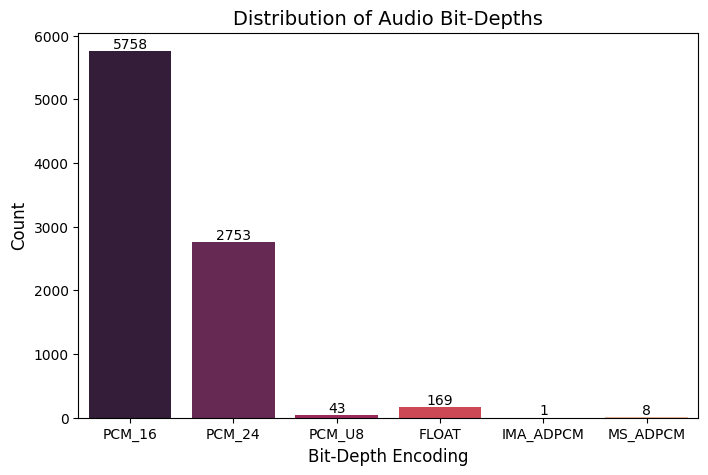


Detailed Counts:
bit_depth
PCM_16       5758
PCM_24       2753
FLOAT         169
PCM_U8         43
MS_ADPCM        8
IMA_ADPCM       1
Name: count, dtype: int64


In [22]:
bit_depths = []

print("Scanning audio bit-depths...")

for index, row in metadata_df.iterrows():
    file_path = os.path.join('UrbanSound8K', 'audio', f"fold{row['fold']}", row['slice_file_name'])
    
    try:
        info = sf.info(file_path)
        bit_depths.append(info.subtype)
    except Exception as e:
        continue
        
    if (index + 1) % 1000 == 0:
        print(f"Scanned {index + 1} files...")

df_bits = pd.DataFrame(bit_depths, columns=['bit_depth'])

plt.figure(figsize=(8, 5))
ax = sns.countplot(x='bit_depth', data=df_bits, palette='rocket')

plt.title('Distribution of Audio Bit-Depths', fontsize=14)
plt.xlabel('Bit-Depth Encoding', fontsize=12)
plt.ylabel('Count', fontsize=12)

for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.show()

print("\nDetailed Counts:")
print(df_bits['bit_depth'].value_counts())

Our analysis shows **heterogeneity in the encoding formats**.

However, a **raw value of 5000 means something completely different in a 16-bit file vs. a 24-bit file**. Training a model on these raw integers would bias the network towards files with higher bit-depths simply because their numbers are larger.

Therefore, **we are going to convert all audio samples into floating-point values within the range of -1.0 to 1.0**.

Reasons:
- **Volume Invariance:** A "Dog Bark" should be classified as such whether it is **recorded near the microphone (loud) or far away (quiet)**. **Normalization ensures the model focuses on the pattern** of the sound wave rather than its absolute amplitude.
- **Numerical Stability:** Neural Networks converge faster and achieve better performance when input features operate within a small, standardized range (typically -1 to 1 or 0 to 1).

## **Audio Preprocessing Pipeline**

This **pipeline will be applied to every audio file in the dataset before feature extraction**. It ensures that the Neural Network receives data that is **spectrally consistent, dimensionally consistent and numerically stable**.

In [23]:
TARGET_SAMPLE_RATE = 44100
TARGET_DURATION = 4.0      
SAMPLES_PER_FILE = int(TARGET_SAMPLE_RATE * TARGET_DURATION)

def preprocess_audio(file_path):
    """
    Lê o arquivo, converte para mono, normaliza amplitude e aplica padding/corte
    para garantir exatamente SAMPLES_PER_FILE.
    """
    try:
        audio, _ = librosa.load(file_path, sr=TARGET_SAMPLE_RATE, mono=True)
        
        # Amplitude normalization
        if np.max(np.abs(audio)) > 0:
            audio = audio / np.max(np.abs(audio))

        # Padding or truncate to ensure exact sample length
        if len(audio) < SAMPLES_PER_FILE:
            padding = SAMPLES_PER_FILE - len(audio)
            audio = np.pad(audio, (0, padding), mode='constant')
        else:
            audio = audio[:SAMPLES_PER_FILE]
            
        return audio
        
    except Exception as e:
        print(f"Error processing {file_path}: {e}")
        return None

For prevent errors we are going to test our pipeline.

In [24]:
print("Verifying pipeline...")
row = metadata_df.iloc[0]
test_path = os.path.join('UrbanSound8K', 'audio', f"fold{row['fold']}", row['slice_file_name'])

processed_audio = preprocess_audio(test_path)

if processed_audio is not None:
    print(f"File: {row['slice_file_name']}")
    print(f"Target Shape: ({SAMPLES_PER_FILE},)")
    print(f"Output Shape: {processed_audio.shape}")
    is_mono = (processed_audio.ndim == 1)
    print(f"Channels: {'1 (Mono)' if is_mono else f'{processed_audio.shape[-1]} (Stereo)'} -> {'[OK]' if is_mono else '[FAIL]'}")
    print(f"Value Range: [{processed_audio.min():.3f}, {processed_audio.max():.3f}]")
    print("Status: Pipeline Ready.")

Verifying pipeline...
File: 100032-3-0-0.wav
Target Shape: (176400,)
Output Shape: (176400,)
Channels: 1 (Mono) -> [OK]
Value Range: [-0.967, 1.000]
Status: Pipeline Ready.


## **Feature Extraction**

In this section, we process the raw audio data to **extract meaningful features for our Deep Learning models**.

We are extracting features from **both MFCCs and Mel-Spectograms** to use on our Neural Networks.

### **Feature Extraction - MFCCs**

Instead of feeding the raw waveform directly into the neural networks, we utilize **Mel-Frequency Cepstral Coefficients (MFCCs)**.

- **Why MFCCs**?

    MFCCs are a **widely used feature extraction technique** in audio signal processing.

According to the UrbanSound8K benchmark paper, **MFCCs provide a robust baseline for environmental sound classification**.

- **Adaptation for Deep Learning**

    To leverage the **ability of Deep Neural Networks to learn temporal and spatial patterns**, we will **preserve the temporal structure** of the MFCCs, **resulting in a 2D representation** (Time x Frequency) rather than a 1D statistical vector.

- **Configuration Parameters:**
    We follow the **technical specifications of the benchmark paper while adapting the output format**:

    - **Sample Rate:** 44.100 kHz (Standard high-quality audio).
    - **n_mfcc:** 40 coefficients.
        - *Note:* While 13 coefficients are standard for speech, **40 are recommended for environmental sounds to capture higher frequency details**.
    - **FFT Window:** 1024 samples (~23ms).
    - **Hop Length:** 512 samples (50% overlap).

The **resulting output** for each audio file will be a **matrix of shape *(40, 345)***, effectively treating the sound as an "image" or a **time-series sequence**.

**Observation:** The number **345 results of the mathematical calculations of 4 seconds times 44,100 Hz (176,400) divided by the hop length which gives us a total of ~345**.

In [25]:
# Configurations for MFCC 
N_MFCC = 40
N_FFT = 1024
HOP_LENGTH = 512
FIXED_FRAMES = 345 

def extract_mfcc_dataset(df):
    features = []
    labels = []
    folds = []
    
    print("Initializing feature extraction (MFCCs)...")
    
    for index, row in tqdm(df.iterrows(), total=df.shape[0]):
        
        file_path = os.path.join('UrbanSound8K', 'audio', f"fold{row['fold']}", row['slice_file_name'])
    
        audio_data = preprocess_audio(file_path)
        
        if audio_data is not None:
            # Extraction
            mfccs = librosa.feature.mfcc(
                y=audio_data, 
                sr=TARGET_SAMPLE_RATE, 
                n_mfcc=N_MFCC,     
                n_fft=N_FFT,      
                hop_length=HOP_LENGTH   
            )
            # Ensure fixed shape
            if mfccs.shape[1] > FIXED_FRAMES:
                mfccs = mfccs[:, :FIXED_FRAMES]
            elif mfccs.shape[1] < FIXED_FRAMES:
                pad_width = FIXED_FRAMES - mfccs.shape[1]
                mfccs = np.pad(mfccs, ((0, 0), (0, pad_width)), mode='constant')
            
            features.append(mfccs)
            labels.append(row['classID'])
            folds.append(row['fold'])
            
    # Convert to numpy array
    X = np.array(features)
    y = np.array(labels)
    folds = np.array(folds, dtype=int) # Force integer
    
    return X, y, folds

Once our **function is defined** we start our feature extraction.

In [26]:
csv_path = 'UrbanSound8K/metadata/UrbanSound8K.csv' 

try:
    metadata_df = pd.read_csv(csv_path)
    print("Metadata loaded successfully.")
    # Extract features
    X_mfcc, y_mfcc, folds_mfcc = extract_mfcc_dataset(metadata_df)

    # Verify results
    print("\n Extraction Completed")
    print(f" MFCC Features (X_mfcc) shape: {X_mfcc.shape}")
    print(f"Labels (y_mfcc) shape: {y_mfcc.shape}")
    print(f"Folds (folds_mfcc) shape: {folds_mfcc.shape}")

    # Save to future use
    np.save('X_mfcc.npy', X_mfcc)
    np.save('y_mfcc.npy', y_mfcc)
    np.save('folds_mfcc.npy', folds_mfcc)
    print("Numpy files saved! You can proceed to training.")
except FileNotFoundError:
    print(f"ERROR: Could not find the file {csv_path}. Please check if the 'UrbanSound8K' folder is in the correct location.")

Metadata loaded successfully.
Initializing feature extraction (MFCCs)...


  0%|          | 0/8732 [00:00<?, ?it/s]

100%|██████████| 8732/8732 [01:53<00:00, 76.73it/s] 



 Extraction Completed
 MFCC Features (X_mfcc) shape: (8732, 40, 345)
Labels (y_mfcc) shape: (8732,)
Folds (folds_mfcc) shape: (8732,)
Numpy files saved! You can proceed to training.


The **output dimensions confirm that the extraction pipeline was successful** and consistent with our design parameters:

**Feature Matrix X: (8732, 40, 345)**
- **8732 (Samples):** Matches the total number of valid entries in the UrbanSound8K metadata, confirming that every file was processed without errors.
- **40 (Frequency Bands):** Corresponds to the our *n_mfcc=40* parameter. This represents the **spectral height of our data**, capturing sufficient detail for environmental sound distinction.
- **345 (Time Steps):** Represents the **temporal width of the "audio image"**.

**Targets y and folds: (8732,)**
- The shape (8732,) confirms a perfect **1-to-1 alignment** with the feature matrix.
- This ensures that **for every feature array in X, there is exactly one corresponding class label in y and one fold assignment**, guaranteeing **data integrity for the cross-validation process**.

### **Feature Extraction - Mel Spectogram**

We **utilize Mel-Spectrograms as a high-resolution feature representation**.

- Why **Mel-Spectrograms?**

    - **Mel-Spectrograms offer a visual representation of the sound's spectral energy**, measured on the perceptually relevant Mel-scale. The method is often **favored by Convolutional Neural Networks (CNNs) as it provides a richer**, less compressed data input compared to MFCCs.

- **Adaptation for Deep Learning:**

    - We will also **preserve the temporal structure** of the Mel-Spectrograms, resulting in a **2D representation (Time x Frequency)**, however a necessary step is needed to convert the raw power spectrum to a logarithmic (decibel) scale.

- **Configuration Parameters:**

    - As in the **MFCC baseline**, we **maintain the same time-frequency parameters** (Sample Rate, FFT Window, and Hop Length) to **ensure consistency in the time resolution (width) of the output tensors**. The only change is the the **coefficients, which are going to be 128 Mel Bands**.

In [27]:
# Configurations for Mel-Spectrogram
N_MELS = 128
N_FFT = 1024
HOP_LENGTH = 512
FIXED_FRAMES = 345

def extract_mels_dataset(df):
    features = []
    labels = []
    folds = []
    
    print("Initializing feature extraction (Mel-Spectrograms)...")
    
    for index, row in tqdm(df.iterrows(), total=df.shape[0]):
        file_path = os.path.join('UrbanSound8K', 'audio', f"fold{row['fold']}", row['slice_file_name'])
        
        audio_data = preprocess_audio(file_path)
        
        if audio_data is not None:
            # Extraction 
            mels = librosa.feature.melspectrogram(
                y=audio_data, 
                sr=TARGET_SAMPLE_RATE, 
                n_mels=N_MELS,
                n_fft=N_FFT, 
                hop_length=HOP_LENGTH
            )
            
            # Convert to Decibels
            mels_db = librosa.power_to_db(mels, ref=np.max)
            
            # Ensure fixed shape
            if mels_db.shape[1] > FIXED_FRAMES:
                mels_db = mels_db[:, :FIXED_FRAMES]
            elif mels_db.shape[1] < FIXED_FRAMES:
                pad_width = FIXED_FRAMES - mels_db.shape[1]
                mels_db = np.pad(mels_db, ((0, 0), (0, pad_width)), mode='constant')
            
            features.append(mels_db)
            labels.append(row['classID'])
            folds.append(row['fold'])
            
    # Convert to numpy array
    X = np.array(features)
    y = np.array(labels)
    folds = np.array(folds, dtype=int) # Force integer   
    return X, y, folds

Once our **function is defined** we start our feature extraction.

In [28]:
csv_path = 'UrbanSound8K/metadata/UrbanSound8K.csv'

try:
    metadata_df = pd.read_csv(csv_path)
    print("Metadata loaded successfully.")
    X_mels, y_mels, folds_mels = extract_mels_dataset(metadata_df)

    #Verify results
    print("\nExtraction Completed")
    print(f"Mel-Spectrogram Features (X_mels) shape: {X_mels.shape}")
    print(f"Labels (y_mels) shape: {y_mels.shape}")
    print(f"Folds (folds_mels) shape: {folds_mels.shape}")

    # Save to future use
    np.save('X_mels.npy', X_mels)
    np.save('y_mels.npy', y_mels)
    np.save('folds_mels.npy', folds_mels)
    print("Numpy files saved! You can proceed to training.")
except FileNotFoundError:
    print(f"ERROR: Could not find the file {csv_path}. Please check if the 'UrbanSound8K' folder is in the correct location.")

Metadata loaded successfully.
Initializing feature extraction (Mel-Spectrograms)...


100%|██████████| 8732/8732 [02:04<00:00, 70.39it/s] 



Extraction Completed
Mel-Spectrogram Features (X_mels) shape: (8732, 128, 345)
Labels (y_mels) shape: (8732,)
Folds (folds_mels) shape: (8732,)
Numpy files saved! You can proceed to training.


This **output dimensions also confirm that the extraction pipeline was successful** and consistent with our design parameters:

**Feature Matrix X: (8732, 128, 345)**

The only value changed was:
- **128 (Frequency Bands):** Corresponds to the our *n_mels=128* parameter. This represents the **spectral height of our data**.


# <center> **Modeling**

## **Deep Learning Classifier - Multilayer Perceptron (MLP)**

 <center> <img src = "fotos/MLP.png"> </center>

The **Multilayer Perceptron (MLP)** is a fundamental type of artificial neural network categorized as a **feedforward neural network**.

In this architecture, information flows in a single direction, from the input nodes, through the hidden nodes, to the output nodes, without forming any cicles!

- **Architecture and Components:**
    An MLP is composed of densely interconnected simple units called neurons, organized into layers:
    - **Input Layer:** This layers receives the raw data or extracted features. It copies the networks's input.
    - **Hidden Layers:** These are intermediate layers where feature extraction and abstraction occur. In a fully connected layer, each neuron is connected to all neurons in the previous layer. According to the Universal Approximator Theorem, a single hidden layer is sufficient to represent an approximation of any function, though deeper networks may be more efficient.
    - **Output Layer:** This layer produces the final prediction of the network. For a classification problem, the output layer represents the probability distribution of the different classes.

- **Neuron Computation:**
    Each computational neuron performs a specific task comprising two steps:
    - **Linear Combination:** The neuron computes a weighted sum of its inputs (x) plus a bias term (b). In vector notation for a neuron $k$: $z = w_k^T x + b_k$
    - **Activation Function:** A non-linear function  $\varphi(.)$ is applied to the linear result. Common activation functions include:
        - **Sigmoid:** Maps inputs to a range of [0,1] - useful for probabilities.
        - **ReLU (Rectified Linear Unit):** Defined as $g(z) = max\{0, z\}$. It is the default activation function for most neural networks as it is easy to optimize.
        - **Softmax:** Typically used at the output layer for multi-class classification problems to represent a probability distribution.

- **Training Strategy:**
    Learning in an MLP is treated as an optimization problem to minimize a **loss function**, which quantifies the error between the network output and the true label.
    - **Loss Function:** For classification, the **Cross-Entropy** is commonly used, which is equivalent to maximizing the likelihood of the label given the input.
    - **Backpropagation:** To update the weights, the network uses the backpropagation algorithm. This leverages the chain rule of derivatives to efficiently compute the gradient of the loss function with respect to the weigths, propagating the error backward from the output to the input.
    - **Optimization:** The weights are updated iteratively using gradient-based methods like **Stochastic Gradient Descendent (SGD)**, or adaptive learning rate methods like **RMSProp** and **Adam**.


## **Deep Learning Classifier - Convolutional Neural Network (CNN)**

<center><img src = "fotos/CNN.jpg"></center>

**Convolutional Neural Networks (CNNS)** are specialized feedforward networks designed for processing data with a grid-like topology, such as images or time-frequency representations of sound.

They allow for "end-to-end learning", automatically extracting features from raw data rather than relying on manual feature feature engineering.

- **Core Operations and Layers:**
        CNNs replace standard matrix multiplication with convolution operations.
    - **Convolution Layer:** This is the core building block. It uses learnable filters (kernels) that slide over the input.
        - **Parameter Sharing:** Unlike dense layers, CNNs share the same parameters (filters) across all spatial locations, drastically reducing the number of parameters.
        - **Sparse Connectivity:** Neurons in a layer are only connected to a small region of the layer before it (the receptive field), rather than all neurons.
        - **Feature Maps:** The output of a convolution is a set of feature maps, where each map extracts specific features (e.g., edges in early layers, abstract concepts in deeper layers).
        - **Pooling Layer:** These layers are used to reduce the data dimension (subsampling) and provide invariance against small translations. Common types include Max Pooling and Average Pooling.
        - **Fully Connected Layer:** After sequences of convulotion and pooling, the high-level reasoning is done via fully connected layers, similar to an MLP classifier.
- **Input Configuration:** For audio classification tasks like ours, CNNs can be configured in two ways:
    - **1D CNNs:** Applied directly to the raw audio signal waveform (1D input).
    - **2D CNNs:** Applied to 2D representations od sound, such as Mel-frequency cepstral coefficients (MFCCs) or spectograms, treating the audio similarly to an image.

## **Deep Learning Classifier - Recurrent Neural Network (RNN)**

<center><img src ="fotos/RNN.png" width = 30%></center>

Lastly, **Recurrent Neural Networks (RNNs)** are a family of networks designed for processing sequential data ($x^{(1)}, x^{(2)}, ..., x^{(\tau)}$), such as speech or text.

Unlike feedforward networks, their computational graphs include cycles, allowing them to share parameters across time.

- **Mechanisms and Architecture:**
    - **Hidden State:** RNNs maintain a "hidden state" $h^{(t)}$ that acts as a memory, summarizing task-relevant aspects of the past sequence of inputs up to time $t$. The state is updated at each step based on the previous state and the current input $h^{(t)} = f(h^{(t-1)}, x^{(t)}; \theta)$.
    - **Unfolding:** For training, the network is often conceptualized as "unfolded" in time, creating a deep network structure where each layer represents a time step.
    - **BPTT:** Training is performed using **Backpropragation Through Time (BPTT)**, where gradients are propagated back through the unrolled graph.

- **Long-Term Dependencies and Gating:**
Standard RNNs struggle with learning long-term dependencies due to the **vanishing gradient** problem, where gradients tend to decay exponentially over long sequences. To address this, advanced architectures are used:
    - **LSTM ( Long Short-Term Memory):** Introduces a cell state and gating mechanisms (Input, Forget and Output gates) to regulate the flow of information. The forget gate specifically allows the network to learn what information to discard and what to keep, enabling it to bridge long time lags.
    - **GRU (Gated Recurrent Unit):** A simplified variation of the LSTM that combines the forget and input gates into a single "update gate" and merges the cell state and hidden state. It is often more computationally efficient while maintaining similar performance.

This architecture allows the model to process audio excerpts by maintaining the temporal order of frequencies, which is essential for classifying dynamic sounds

## **Hardware Acceleration**

The training of the models was carried out using **GPU (Graphics Processing Unit) acceleration**.

The **use of the GPU is essential in Deep Learning to parallelize the intensive matrix operations of the convolutional layers**, allowing for a significant reduction in training time within the 10-fold cross-validation scheme.

In [29]:
gpus = tf.config.list_physical_devices('GPU')

if gpus:
    print("GPU detected! TensorFlow will utilize the GPU for computations.")
    print(f"GPU found: {gpus}")
    # Opcional: Imprimir o nome do primeiro dispositivo
    print(f"Device name: {gpus[0].name}")
else:
    print("No GPU detected. TensorFlow will use the CPU.")

GPU detected! TensorFlow will utilize the GPU for computations.
GPU found: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Device name: /physical_device:GPU:0


## **Model Selection & Architecture Justification**

In this phase we detail the two Deep Learning Architectures selected for the urban sound classification task: the **2D Convolutional Neural Network (CNN)** and the **Multilayer Perceptron (MLP)**.

### **Deep Learning Classifier: 2D Convolutional Neural Network (CNN) - Using MFCCs**

The **Convolutional Neural Network (CNN)** is a specialized feedforward network designed to process data with a grid-like topology.

By treating our audio features (MFCCs) as 2D images, the CNN can automatically learn hierarchical patterns—detecting simple edges (frequency shifts) in early layers and complex sound textures in deeper layers.

#### **Input Configuration**

Instead of flattening the data, we preserve the spatial structure of the MFCCs.

- **Input Shape:** (Height, Width, Channels) - (N_MFCCs, Time_Frames, 1), in our case (40,345,1)
- **Explanation:** We treat the MFCCs as a grayscale image (1 channel). This allows the model to exploit local correlations between adjacent frequency bands and time steps.

#### **Architecture and Layers**

The network is constructed using a sequence of **Convolutional Blocks** followed by a **Classification Head**. We defined a **4-block** architecture to balance feature extraction capability with model complexity.

- **Convolutional Layers (Feature Extraction):**
    - **Mechanism:** Unlike dense layers, these layers perform convolution operations using learnable filters (kernels) that slide over the input. This allows for parameter sharing (detecting the same sound pattern anywhere in the clip) and sparse connectivity.
    - **Configuration:** We use 4 layers with progressively increasing filter counts: 32, 64, 128 and 256. The last block was added to increase representational capacity before Global Average Pooling.
    - **Kernel Size:** 3 x 3. Small kernels are computationally efficient and effective at capturing fine-grained local details in the spectrogram.
    - **Activation:** **ReLU** is applied after each convolutional. This introduces non-linearity and accelerates convergence by mitigating the vanishing gradient problem.
    - **Padding:** Padding of "same" is used to maintain dimensionality integrity.
- **Pooling Layers (Downsampling):**
    - **Mechanism:** We apply **Max Pooling** with a 2 x 2 window after each convolutional block.
    - **Purpose:** This reduces the spatial dimensions of the feature maps, lowering the computational cost and number of parameters. Crucially, it provides invariance to small translations, ensuring the model recognizes a sound even if it shifts slightly in time or frequency.
- **Regularization:**
    - **Batch Normalization:** Applied to the inputs and after convolutions to normalize layer inputs (zero mean, unit variance), stabilizing training and allowing for higher learning rates.
    - **Dropout:** We apply a dropout rate of 0.1 on the first two convolutional blocks and 0.2 on the next two blocks. After feature extraction, we apply 0.4 before the final classification layer. This randomly "switches off" neurons during training to prevent the model from over-relying on specific features (overfitting).
- **Classification Head (Dense Layers):**
    - **GlobalAveragePooling2D:** Reduce each feature map to a single value.
    - **Hidden Dense Layers:** **256 neurons** (ReLU) to interpret the high-level features extracted by the CNN.
    - **Output Layer:** **10 neurons** with **Softmax** activation. This generates a probability distribution summing to 1, where each neuron corresponds to one of the 10 urban sound classes.

#### **Training Strategy**

- **Loss Function:** **Categorical Cross-Entropy**, this maximizes the log-likelihood of the correct class given the input spectogram.

- **Optimizer:** **Adam**, an adaptive learning rate optimization algorithm that combines the advantages of RMSProp and Momentum, generally providing faster convergence.

- **Learning Rate:** We are going to use an learning rate of 0.001 because it offers the best balance between convergence speed and training stability.

- **Mini-batch Size:** The value 32 was chosen to balance GPU utilization and gradient stability.

- **Max Epochs:** Defined 40 as the upper training limit, this value is combined with *Early Stopping* to ensure the model only trains for the necessary number of steps.

- **Early Stopping:** Monitors **val_loss** with *patience=10* and *restore_best_weights=True*, this way training stops after 10 epochs without improvement and returns the best weights.

- **Learning Rate Scheduler:** Automatically reduces the learning rate when the validation loss plateaus, allowing the optimizer to search for the global minimum more effectively. We use **ReduceLROnPlateau** on *val_loss* with *factor=0.3*, *patience=5*, and *min_lr=1e-7* to reduce the learning rate when validation loss plateaus.

#### **Code Structure and Implementation**

In this section, we implement **all components necessary to train the CNN model**, including the **training hyperparameters, data preparation function, callback setup, and the full 2D CNN architecture**. .

In [30]:
# CNN Training Configurations
BATCH_SIZE = 32
MAX_EPOCHS = 40        
LEARNING_RATE = 0.001  
N_CLASSES = 10

# Create directory for saving models and data
os.makedirs('CNN_data/MFCC', exist_ok=True)
os.makedirs('CNN_data/Mel_Spectrogram', exist_ok=True)

def prepare_data_for_cnn(X, y):
    """ 
    Creates a new axis for channels and converts labels to OHE (One-Hot Encoding).
    """
    X_processed = X[..., np.newaxis].astype('float32')
    y_ohe = to_categorical(y, num_classes=N_CLASSES)
    return X_processed, y_ohe

def get_callbacks(fold_num, model_type):
    """
    Callbacks for training: EarlyStopping, ModelCheckpoint, ReduceLROnPlateau.
    """
    save_path = f'CNN_data/{model_type}/best_model_fold_{fold_num}.keras'
    
    callbacks = [
        EarlyStopping(
            monitor='val_loss', 
            patience=10, 
            restore_best_weights=True,
            verbose=1
        ),
        ModelCheckpoint(
            filepath=save_path,
            monitor='val_loss', 
            save_best_only=True,
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.3,  
            patience=5,   
            min_lr=1e-7,
            verbose=1
        )
    ]
    
    return callbacks

print("CNN Training Configurations:")
print(f"Batch Size: {BATCH_SIZE} | Max Epochs: {MAX_EPOCHS} | LR: {LEARNING_RATE}")

CNN Training Configurations:
Batch Size: 32 | Max Epochs: 40 | LR: 0.001


In [31]:
def create_cnn_2d_model(input_shape, learning_rate=0.001):
    """
   Creates a 2D CNN model using Keras Sequential API with Global Average Pooling.
    """
    model = Sequential([
        # Batch Normalization
        BatchNormalization(input_shape=input_shape),
        
        # First Conv Block
        Conv2D(32, (3, 3), padding='same', use_bias=False),
        BatchNormalization(),
        Activation('relu'),
        MaxPooling2D((2, 2)),
        Dropout(0.1),
        
        # Second Conv Block
        Conv2D(64, (3, 3), padding='same', use_bias=False),
        BatchNormalization(),
        Activation('relu'),
        MaxPooling2D((2, 2)),
        Dropout(0.1),
        
        # Third Conv Block
        Conv2D(128, (3, 3), padding='same', use_bias=False),
        BatchNormalization(),
        Activation('relu'),
        MaxPooling2D((2, 2)),
        Dropout(0.2),
        
        # Fourth Conv Block (Extra to compensate for GAP reduction)
        Conv2D(256, (3, 3), padding='same', use_bias=False),
        BatchNormalization(),
        Activation('relu'),
        MaxPooling2D((2, 2)),
        Dropout(0.2),
        
        # Global Average Pooling
        GlobalAveragePooling2D(),
        
        # Classification
        # Since GAP drastically reduces the dimension, we can have a smaller or direct Dense layer
        Dense(256, use_bias=False), 
        BatchNormalization(),
        Activation('relu'),
        Dropout(0.4),
        
        # Output
        Dense(10, activation='softmax', dtype='float32') 
    ])
    
    model.compile(
        optimizer=Adam(learning_rate=learning_rate), 
        loss='categorical_crossentropy', 
        metrics=['accuracy']
    )
    
    return model

### **Deep Learning Classifier: 2D Convolutional Neural Network (CNN) - Using Mel-Spectogram**

The Convolutional Neural Network (CNN) architecture used for Mel-Spectrograms is intentionally **kept identical to the one employed for MFCCs**.

This **allows** for a **controlled comparison between feature representations, isolating the impact of the input type on the model’s performance**.

- **Why train a second CNN Model**?

    By training the **same CNN architecture on Mel-Spectrograms**, we ensure a **controlled comparison with the MFCC-based model**.
    
    **Mel-Spectrograms contain richer and more detailed frequency information**, which may enable the network to **capture subtler acoustic patterns and potentially achieve higher classification accuracy**.
    
    This setup isolates the effect of the feature representation itself, allowing us to evaluate whether the additional spectral detail provided by Mel-Spectrograms translates into improved model performance.

### **Deep Learning Classifier - Multilayer Perceptron (MLP) - Using MFCCs**

The **Multilayer Perceptron (MLP)** is a fundamental type of **feedforward neural network**.

In this architecture, information flows in a **single direction**: from the **input layer, through one or more hidden layers, to the output layer**, without any recurrent connections or cycles.

In our project, the **MLP is used as a baseline deep learning model** to assess how discriminative the MFCC features are **when treated purely as numeric vectors**, without exploiting their 2D structure as in the CNN.

#### **Input Configuration**

Instead of preserving the 2D topology of the MFCCs, we *flatten* them into a single vector:

- **Input Shape:** 40 MFCC coefficients × 345 time frames = *13 800* input features

- **Flattening Strategy:** The MFCC matrix for each audio clip is reshaped from (40, 345) to (13800,). Each time–frequency coefficient is treated as an independent feature.

- **Motivation:**

    This representation removes any explicit spatial/temporal structure. 

    It forces the MLP to *learn all relevant patterns directly from the numeric features*, without convolutions or local weight sharing.

    It provides a clean baseline to compare with the CNN, which *does* exploit the spectro-temporal layout.

- **Normalization:** For each fold, we apply **z-score normalization** (StandardScaler) using only the **training split**, then transform validation and test sets with the same scaler. This ensures:

    - Zero mean and unit variance per feature.

    - No information leakage from validation/test into the training process.

#### **Architecture and Layers**

The final MLP architecture is a **three-hidden-layer network** with progressively decreasing width:

- **Hidden Layer Stack:**

    1. **Dense(512) + BatchNorm + Dropout(0.5)**
        - First transformation from the 13,800-dimensional input space
        - High dimensionality (512 units) allows the network to learn a rich set of intermediate feature combinations.
    2. **Dense(256) + BatchNorm + Dropout(0.4)**
        - Reduces dimensionality while keeping enough capacity to model non-linear patterns.
    3. **Dense(128) + BatchNorm + Dropout(0.3)**
        - Acts as a compact, high-level representation before classification.

- **Activation Function (Hidden Layers):**
    - We use **ReLU** for all hidden layers.
    - ReLU introduces non-linearity, is computationally efficient, and helps mitigate vanishing-gradient issues.

- **Batch Normalization:**
    - Applied after each dense layer and before dropout.
    - Normalizes activations to have approximately zero mean and unit variance.
    - Stabilizes and speeds up training, allowing the use of a relatively larger learning rate without divergence.
    - Reduces sensitivity to initialization and improves generalization.

- **Dropout:**
    - Dropout rates of **0.5 → 0.4 → 0.3** across the three hidden layers.
    - Randomly “turns off” a fraction of neurons during training, forcing the network to learn **redundant and robust representations**.
    - Acts as a strong regularizer to combat overfitting, which is crucial given the high input dimensionality (13,800 features).

- **Output Layer (Classification Head):**
    - **Dense(10) with Softmax activation**.
    - Produces a probability distribution over the **10 urban sound classes**, where each output dimension corresponds to one class.


#### **Training Strategy**

- **Loss Function:** **Categorical Cross-Entropy**, the standard choice for multi-class classification with mutually exclusive labels. It maximizes the log-likelihood of the correct class.

- **Optimizer:** **Adam** with an initial learning rate of **0.0005**. Adam adaptively adjusts learning rates per parameter, combining the benefits of RMSProp and Momentum, which leads to stable and relatively fast convergence in high-dimensional spaces.

- **Mini-Batch Size:** **64** samples per batch. This value balances:

    - Stable gradient estimates (larger batches)

    - Memory constraints and training time.

- **Max Epochs:** Upper limit of **40 epochs**. The actual number of training epochs is often lower due to early stopping.

- **Early Stopping:** Monitors **validation loss** and stops training when no improvement is observed for a given ***patience** window. Restores the **best model weights** seen during training, helping to capture the point of best generalization.

- **Learning Rate Scheduler:** **ReduceLROnPlateau** is used: when validation loss plateaus, the learning rate is reduced by a factor of 0.5 (down to a minimum of \(1 \times 10^{-6}\)). This allows the optimizer to:

    - Take larger steps in early training.

    - Switch to finer adjustments once the model approaches a good solution.

- **Model Checkpointing:** For each fold, we save the model with the **lowest validation loss**. Evaluation on the test set is always done using this best checkpoint, not simply the last epoch.

#### **Code Structure and Implementation**

In [32]:
# MLP Improved Training Configurations
BATCH_SIZE_MLP    = 64
MAX_EPOCHS_MLP    = 40
LEARNING_RATE_MLP = 0.0005
USE_CLASS_WEIGHTS_MLP = True

RESULTS_DIR_MLP = "MLP_improved_data"
os.makedirs(RESULTS_DIR_MLP, exist_ok=True)

print("MLP Improved Training Configurations:")
print(f"  Batch Size: {BATCH_SIZE_MLP}")
print(f"  Max Epochs: {MAX_EPOCHS_MLP}")
print(f"  Learning Rate: {LEARNING_RATE_MLP}")
print(f"  Use class weights: {USE_CLASS_WEIGHTS_MLP}")
print(f"  Save dir: {RESULTS_DIR_MLP}")


def mlp_preprocess(
    X_train_raw, y_train_raw,
    X_val_raw,   y_val_raw,
    X_test_raw,  y_test_raw,
    use_class_weights=True
):
    """
    Preprocessamento específico do MLP:
      - Flatten (40,345) -> (13800)
      - StandardScaler por fold
      - One-hot das labels
      - class_weight opcional
    """
    # Flatten
    X_train_flat = X_train_raw.reshape(X_train_raw.shape[0], -1).astype("float32")
    X_val_flat   = X_val_raw.reshape(X_val_raw.shape[0],   -1).astype("float32")
    X_test_flat  = X_test_raw.reshape(X_test_raw.shape[0],  -1).astype("float32")

    # StandardScaler
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train_flat)
    X_val_scaled   = scaler.transform(X_val_flat)
    X_test_scaled  = scaler.transform(X_test_flat)

    # One-hot encoding das labels
    y_train = to_categorical(y_train_raw, num_classes=N_CLASSES)
    y_val   = to_categorical(y_val_raw,   num_classes=N_CLASSES)
    y_test  = to_categorical(y_test_raw,  num_classes=N_CLASSES)

    # Class weights
    class_weight = None
    if use_class_weights:
        cw = compute_class_weight(
            class_weight='balanced',
            classes=np.unique(y_train_raw),
            y=y_train_raw
        )
        class_weight = {int(c): float(w) for c, w in zip(np.unique(y_train_raw), cw)}

    return X_train_scaled, y_train, X_val_scaled, y_val, X_test_scaled, y_test, class_weight


def get_mlp_callbacks(fold_num, model_type=None):
    """
    Callbacks para o MLP
    """
    save_path = f"{RESULTS_DIR_MLP}/best_model_fold_{fold_num}.keras"
    
    callbacks = [
        EarlyStopping(
            monitor='val_loss',
            patience=10,
            restore_best_weights=True,
            verbose=1
        ),
        ModelCheckpoint(
            filepath=save_path,
            monitor='val_loss',
            save_best_only=True,
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=4,
            min_lr=1e-6,
            verbose=1
        )
    ]
    return callbacks


def create_mlp_improved(input_shape, learning_rate=LEARNING_RATE_MLP):
    """
    Improved MLP:
      - input_shape: (D,)
      - 256 → 256 → 128 → 10
      - L2 + BatchNorm + Dropout + label smoothing
    """
    # Input dimension conversion
    if isinstance(input_shape, tuple):
        input_dim = int(np.prod(input_shape))
    else:
        input_dim = int(input_shape)

    model = Sequential([
        Dense(
            256, activation='relu', input_dim=input_dim,
            kernel_regularizer=regularizers.l2(1e-4)
        ),
        BatchNormalization(),
        Dropout(0.5),

        Dense(
            256, activation='relu',
            kernel_regularizer=regularizers.l2(1e-4)
        ),
        BatchNormalization(),
        Dropout(0.4),

        Dense(
            128, activation='relu',
            kernel_regularizer=regularizers.l2(1e-4)
        ),
        BatchNormalization(),
        Dropout(0.3),

        Dense(N_CLASSES, activation='softmax')
    ])

    loss_fn = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1)

    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss=loss_fn,
        metrics=['accuracy']
    )
    return model

MLP Improved Training Configurations:
  Batch Size: 64
  Max Epochs: 40
  Learning Rate: 0.0005
  Use class weights: True
  Save dir: MLP_improved_data


# <center>**Evaluation**</center>

In this step we begin by **implementing two essential functions**: one that **plots the evaluation metrics** and another that performs **10-Fold Cross-Validation**.

These functions are **general-purpose** and will be reused across all models to ensure methodological consistency.

After defining these utilities, we proceed to evaluate each model independently.

## **Plot Metrics Function**

In [33]:
def plot_fold_metrics(history, y_true_classes, y_pred_classes, fold_num, 
                      model_name="CNN", class_names=None, save_dir="CNN_data/Mel_Spectrogram"):
    """
    Plota training/validation loss e accuracy, e confusion matrix para um fold.
    Funciona tanto para CNN como para MLP, mudando apenas o save_dir/model_name.
    """
    cm = confusion_matrix(y_true_classes, y_pred_classes)
    fig, axes = plt.subplots(1, 3, figsize=(22, 6))
    
    # Loss
    axes[0].plot(history.history['loss'], label='Train Loss', linewidth=2)
    # FIX: The label argument must be a string assigned using 'label='
    axes[0].plot(history.history['val_loss'], label='Val Loss', linewidth=2) 
    
    axes[0].set_title(f'{model_name} Fold {fold_num} - Loss', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # Accuracy
    axes[1].plot(history.history['accuracy'], label='Train Accuracy', linewidth=2)
    axes[1].plot(history.history['val_accuracy'], label='Val Accuracy', linewidth=2)
    axes[1].set_title(f'{model_name} Fold {fold_num} - Accuracy', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Accuracy')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    # Confusion Matrix
    if class_names is None:
        class_names = ['air_cond', 'car_horn', 'children', 'dog_bark', 'drilling',
                       'engine', 'gun_shot', 'jackhammer', 'siren', 'street_music']
    
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[2], cbar=False,
                xticklabels=class_names, yticklabels=class_names)
    axes[2].set_title(f'{model_name} Fold {fold_num} - Confusion Matrix', fontsize=14, fontweight='bold')
    axes[2].set_xlabel('Predicted', fontsize=12, fontweight='bold')
    axes[2].set_ylabel('True', fontsize=12, fontweight='bold')
    plt.setp(axes[2].xaxis.get_majorticklabels(), rotation=45, ha='right', fontsize=9)
    plt.setp(axes[2].yaxis.get_majorticklabels(), fontsize=9)
    
    plt.tight_layout()
    os.makedirs(save_dir, exist_ok=True)
    plt.savefig(f'{save_dir}/{model_name}_metrics_fold_{fold_num}.png', dpi=150, bbox_inches='tight')
    plt.close(fig)

## **10-Fold Cross Validation Function**

In [34]:
def run_10_fold_cross_validation(
    X,
    y,
    folds,
    model_creator_fn, 
    model_name, 
    model_type,
    preprocess_fn=None,
    get_callbacks_fn=None,
    base_save_dir=None,
    class_names=None,
    batch_size=None,
    max_epochs=None,
    learning_rate=None,
    use_class_weights=False
):
    """
    Runs 10-Fold Cross-Validation for the given model and data.
    """
    global N_CLASSES, BATCH_SIZE, MAX_EPOCHS, LEARNING_RATE

    folds = folds.astype(int)
    unique_folds = np.arange(1, 11)

    if class_names is None:
        class_names = ['air_cond', 'car_horn', 'children', 'dog_bark', 'drilling',
                       'engine', 'gun_shot', 'jackhammer', 'siren', 'street_music']
    if batch_size is None:
        batch_size = BATCH_SIZE
    if max_epochs is None:
        max_epochs = MAX_EPOCHS
    if learning_rate is None:
        learning_rate = LEARNING_RATE
    if base_save_dir is None:
        base_save_dir = f'CNN_data/{model_type}'

    os.makedirs(base_save_dir, exist_ok=True)

    fold_accuracies = []
    cumulative_conf_matrix = np.zeros((N_CLASSES, N_CLASSES), dtype=int)
    all_true = []
    all_pred = []
    
    print(f"\n{'='*70}")
    print(f"Starting 10-Fold Cross-Validation: {model_name}")
    print(f"{'='*70}\n")

    for i in range(len(unique_folds)):
        
        test_fold = unique_folds[i]
        val_fold = unique_folds[(i + 1) % 10]
        train_folds = np.setdiff1d(unique_folds, [test_fold, val_fold])
        
        print(f"\n{'─'*70}")
        print(f"FOLD {test_fold}/10 | Validation: {val_fold} | Train: {list(train_folds)}")
        print(f"{'─'*70}")

        # Masks
        mask_test = (folds == test_fold)
        mask_val = (folds == val_fold)
        mask_train = np.isin(folds, train_folds)
        
        X_train_raw, y_train_raw = X[mask_train], y[mask_train]
        X_val_raw,   y_val_raw   = X[mask_val],   y[mask_val]
        X_test_raw,  y_test_raw  = X[mask_test],  y[mask_test]

        # Specific preprocessing
        if preprocess_fn is not None:
            X_train, y_train, X_val, y_val, X_test, y_test, class_weight = preprocess_fn(
                X_train_raw, y_train_raw,
                X_val_raw,   y_val_raw,
                X_test_raw,  y_test_raw,
                use_class_weights=use_class_weights
            )
        else:
            X_train, y_train = X_train_raw, y_train_raw
            X_val,   y_val   = X_val_raw,   y_val_raw
            X_test,  y_test  = X_test_raw,  y_test_raw
            class_weight = None
        
        # Clear memory
        tf.keras.backend.clear_session()
        gc.collect()
        
        # Create model
        input_shape = X_train.shape[1:]
        model = model_creator_fn(input_shape=input_shape, learning_rate=learning_rate)
        
        # Generic callbacks:
        if get_callbacks_fn is not None:
            callbacks = get_callbacks_fn(fold_num=test_fold, model_type=model_type)
        else:
            callbacks = get_callbacks(fold_num=test_fold, model_type=model_type)
        
        # Training
        print(f"Training (max {max_epochs} epochs)...\n")
        history = model.fit(
            X_train, y_train,
            batch_size=batch_size,
            epochs=max_epochs,
            validation_data=(X_val, y_val),
            callbacks=callbacks,
            shuffle=True,
            verbose=1,
            class_weight=class_weight
        )
        
        # Load best model
        best_model_path = f'{base_save_dir}/best_model_fold_{test_fold}.keras'
        try:
            best_model = tf.keras.models.load_model(best_model_path)
        except:
            best_model = model

        # Evaluate
        loss, accuracy = best_model.evaluate(X_test, y_test, verbose=0)
        print(f"\n✅ Fold {test_fold} Test Accuracy: {accuracy:.4f} ({accuracy*100:.2f}%)")
        fold_accuracies.append(accuracy)
        
        # Predictions
        y_pred_probs = best_model.predict(X_test, verbose=0)
        y_pred_classes = np.argmax(y_pred_probs, axis=1)
        y_true_classes = np.argmax(y_test, axis=1)
        
        all_true.extend(y_true_classes.tolist())
        all_pred.extend(y_pred_classes.tolist())
        
        # Plots per fold
        plot_fold_metrics(
            history,
            y_true_classes,
            y_pred_classes,
            fold_num=test_fold,
            model_name=model_name,
            class_names=class_names,
            save_dir=base_save_dir
        )
        
        cumulative_conf_matrix += confusion_matrix(
            y_true_classes, y_pred_classes, labels=range(N_CLASSES)
        )
        
        # Clear memory
        del model, best_model, history
        tf.keras.backend.clear_session()
        gc.collect()

    # Final Results
    mean_accuracy = np.mean(fold_accuracies)
    std_accuracy = np.std(fold_accuracies)
    
    print(f"\n{'='*70}")
    print(f"FINAL RESULT - {model_name}")
    print(f"{'='*70}")
    print(f"Mean Accuracy: {mean_accuracy:.4f} ({mean_accuracy*100:.2f}%)")
    print(f"Standard Deviation:  ±{std_accuracy:.4f}")
    print(f"{'='*70}\n")
    
    # Accuracy Bar Plot and Cumulative Confusion Matrix
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    
    # Plot 1: Bars
    fold_ids = np.arange(1, 11)
    colors = ['#2ecc71' if acc >= mean_accuracy else '#e74c3c' for acc in fold_accuracies]
    axes[0].bar(fold_ids, fold_accuracies, color=colors, alpha=0.7, edgecolor='black', linewidth=1.5)
    axes[0].axhline(y=mean_accuracy, color='blue', linestyle='--', linewidth=2, 
                    label=f'Mean: {mean_accuracy:.3f}')
    
    for i, acc in enumerate(fold_accuracies, start=1):
        axes[0].text(i, acc + 0.01, f"{acc:.3f}", ha='center', va='bottom', fontweight='bold')
    
    axes[0].set_ylim(0, 1)
    axes[0].set_xlabel("Fold", fontsize=12, fontweight='bold')
    axes[0].set_ylabel("Accuracy", fontsize=12, fontweight='bold')
    axes[0].set_title(f"Accuracy por Fold - {model_name}", fontsize=14, fontweight='bold')
    axes[0].legend()
    axes[0].grid(axis='y', alpha=0.3)
    
    # Plot 2: Final Confusion Matrix
    sns.heatmap(cumulative_conf_matrix, annot=True, fmt='d', cmap='Blues', 
                ax=axes[1], cbar=False,
                xticklabels=class_names, yticklabels=class_names)
    axes[1].set_title(f'Confusion Matrix Acumulada - {model_name}', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Predicted', fontsize=12, fontweight='bold')
    axes[1].set_ylabel('True', fontsize=12, fontweight='bold')
    plt.setp(axes[1].xaxis.get_majorticklabels(), rotation=45, ha='right', fontsize=9)
    
    plt.tight_layout()
    plt.savefig(f'{base_save_dir}/{model_name}_final_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Classification Report
    report = classification_report(all_true, all_pred, 
                                   target_names=class_names, digits=4)
    print("CLASSIFICATION REPORT")
    print(report)

    if 'pd' in globals() and base_save_dir is not None:
        report_dict = classification_report(all_true, all_pred, target_names=class_names, output_dict=True)
        report_df = pd.DataFrame(report_dict).T
        csv_path = f"{base_save_dir}/{model_name}_classification_report.csv"
        report_df.to_csv(csv_path, index=True)
        print(f"\nClassification report saved to: {csv_path}")
    
    return mean_accuracy, fold_accuracies, cumulative_conf_matrix

print("Cross-validation function loaded!")

Cross-validation function loaded!


With all components implemented and configured, we now move on to the evaluation stage to assess the models' performance.

## **Deep Learning Classifier: 2D Convolutional Neural Network (CNN) using MFCCs**

Loading MFCC data...
MFCC data loaded successfully!
Input Shape: (8732, 40, 345, 1)
Labels Shape: (8732, 10)

Starting 10-Fold Cross-Validation: CNN_Simple


──────────────────────────────────────────────────────────────────────
FOLD 1/10 | Validation: 2 | Train: [3, 4, 5, 6, 7, 8, 9, 10]
──────────────────────────────────────────────────────────────────────
Training (max 40 epochs)...

Epoch 1/40
218/218 [==============================] - ETA: 0s - loss: 1.2846 - accuracy: 0.5623
Epoch 1: val_loss improved from inf to 5.32602, saving model to CNN_data/MFCC\best_model_fold_1.keras
218/218 [==============================] - 16s 33ms/step - loss: 1.2846 - accuracy: 0.5623 - val_loss: 5.3260 - val_accuracy: 0.1126 - lr: 0.0010
Epoch 2/40
217/218 [============================>.] - ETA: 0s - loss: 0.8624 - accuracy: 0.7105
Epoch 2: val_loss improved from 5.32602 to 3.93283, saving model to CNN_data/MFCC\best_model_fold_1.keras
218/218 [==============================] - 7s 31ms/step - loss: 

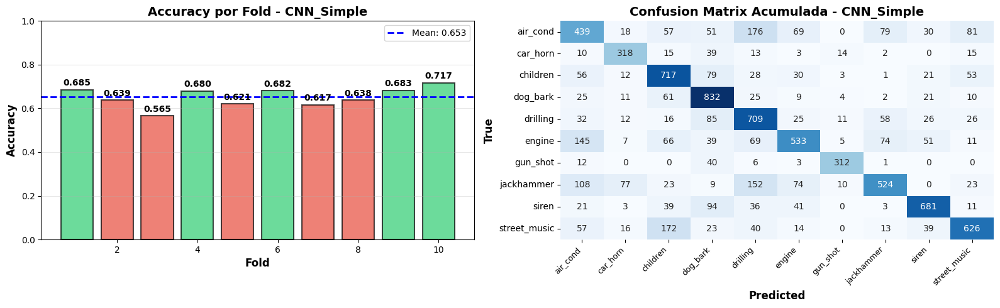

CLASSIFICATION REPORT
              precision    recall  f1-score   support

    air_cond     0.4851    0.4390    0.4609      1000
    car_horn     0.6709    0.7413    0.7043       429
    children     0.6149    0.7170    0.6620      1000
    dog_bark     0.6445    0.8320    0.7263      1000
    drilling     0.5654    0.7090    0.6291      1000
      engine     0.6654    0.5330    0.5919      1000
    gun_shot     0.8691    0.8342    0.8513       374
  jackhammer     0.6922    0.5240    0.5965      1000
       siren     0.7837    0.7330    0.7575       929
street_music     0.7313    0.6260    0.6746      1000

    accuracy                         0.6517      8732
   macro avg     0.6722    0.6689    0.6654      8732
weighted avg     0.6573    0.6517    0.6488      8732


Classification report saved to: CNN_data/MFCC/CNN_Simple_classification_report.csv


In [35]:
# Load MFCC data
try:
    print("Loading MFCC data...")
    X_raw = np.load('X_mfcc.npy')
    y_raw = np.load('y_mfcc.npy')
    folds = np.load('folds_mfcc.npy')
    print("MFCC data loaded successfully!")
except FileNotFoundError:
    print("ERROR: .npy files not found! Run MFCC extraction first.")

# Prepare data (Reshape and OHE)
if 'X_raw' in locals():
    X_cnn, y_ohe = prepare_data_for_cnn(X_raw, y_raw)

    print(f"Input Shape: {X_cnn.shape}")
    print(f"Labels Shape: {y_ohe.shape}")

    # Cross-Validation
    run_10_fold_cross_validation(
        X=X_cnn, 
        y=y_ohe, 
        folds=folds, 
        model_creator_fn=create_cnn_2d_model, 
        model_name="CNN_Simple",
        model_type="MFCC"
    )

<img src="CNN_data/MFCC/CNN_Simple_metrics_fold_1.png">
<img src="CNN_data/MFCC/CNN_Simple_metrics_fold_2.png">
<img src="CNN_data/MFCC/CNN_Simple_metrics_fold_3.png">
<img src="CNN_data/MFCC/CNN_Simple_metrics_fold_4.png">
<img src="CNN_data/MFCC/CNN_Simple_metrics_fold_5.png">
<img src="CNN_data/MFCC/CNN_Simple_metrics_fold_6.png">
<img src="CNN_data/MFCC/CNN_Simple_metrics_fold_7.png">
<img src="CNN_data/MFCC/CNN_Simple_metrics_fold_8.png">
<img src="CNN_data/MFCC/CNN_Simple_metrics_fold_9.png">
<img src="CNN_data/MFCC/CNN_Simple_metrics_fold_10.png">
<img src="CNN_data/MFCC/CNN_Simple_final_analysis.png">

### **Evaluation of CNN Performance Using MFCC Features**


1. **Cross-Validation Accuracy Analysis:**

    The **CNN trained on MFCCs** shows **moderate but consistent performance**, with accuracies across the 10 folds **ranging between 0.57 and 0.73**. The **overall mean accuracy is 0.652**, represented in the bar plot by the dashed blue line. Some folds **(e.g., 4, 5, 7, 9, 10) clearly outperform the global average**, indicating that the model generalizes reasonably well when the data split is favorable.

    Other folds **(notably 3 and 8) underperform, dropping to around 0.57**, suggesting sensitivity to the specific distribution of samples in each fold.

    The **variance across folds reflects the intrinsic complexity of the task** as well as the **limited discriminative power of MFCCs for certain sound classes**.

    Overall, the **cross-validation results indicate that the CNN is capable of learning meaningful audio patterns from MFCCs**, but **may struggle with certain classes or noisy subsets of the dataset**.

2. **Confusion Matrix Interpretation**

    The **accumulated confusion matrix provides deeper insights** into the class-level behavior of the model:

    - **Classes with Strong Performance:**
        - **dog_bark, children_playing, siren, and street_music show excellent recognition**, each with 600–800+ correct predictions. These classes tend to have distinctive spectral patterns easily captured by MFCCs and CNN filters.

    - **Classes with Moderate Performance:** 
        - **drilling, car_horn, engine_idling, and jackhammer show mixed results**. While they achieve reasonable true positive counts, they also display **noticeable confusion with acoustically similar classes**.

    - **Classes with Weak Performance:** 
        - **gun_shot and air_conditioner are particularly problematic:**
            - **gun_shot appears with very few samples overall and suffers from severe class imbalance, leading to poor recall**.
            - **air_conditioner is frequently misclassified as engine_idling or drilling**.

    These patterns **highlight the limitations of MFCCs** for classes that rely heavily on transient or broadband noise components—information MFCCs tend to smooth out.

3. **General Assessment:**

    The CNN trained on MFCCs achieves:

    - **Mean accuracy: ~65.2%**

    - **Reliable performance on distinct classes**

    - **Weak performance on impulsive or harmonically ambiguous sounds**

    - **Moderate variance across folds, suggesting sensitivity to training data distribution**

    - **MFCCs, while compact and widely used, remove much of the fine-grained spectral detail present in raw spectrograms**. This can limit performance for complex scenes or classes with overlapping frequency characteristics.

4. **Summary:**

    The MFCC-based CNN forms a **solid baseline model for urban sound classification**. It successfully captures class-specific spectral cues but is **constrained by the inherent information loss in MFCCs**, particularly for **transient or overlapping sound events**. This evaluation **highlights the motivation for testing a second CNN using Mel-Spectrograms**, which may provide richer frequency resolution and better capture the nuances missing from MFCC-based features.

## **Deep Learning Classifier: 2D Convolutional Neural Network (CNN) using Mel-Spectrogram**

In [ ]:
# Load Mel-Spectrogram Data
try:
    print("Loading Mel-Spectrogram data...")
    X_raw = np.load('X_mels.npy')
    y_raw = np.load('y_mels.npy')
    folds = np.load('folds_mels.npy')
    print("Mel-Spectrogram data loaded successfully!")

except FileNotFoundError:
    print("ERROR: .npy files not found. Run Mel extraction first!")

# Prepare data (Reshape and OHE)
if 'X_raw' in locals():
    # The prepare_data function works the same, the shape adjusts itself
    X_cnn, y_ohe = prepare_data_for_cnn(X_raw, y_raw)

    print(f"Input Shape: {X_cnn.shape}") 
    print(f"Labels Shape: {y_ohe.shape}")

    # Run Cross-Validation
    run_10_fold_cross_validation(
        X=X_cnn, 
        y=y_ohe, 
        folds=folds, 
        model_creator_fn=create_cnn_2d_model, 
        model_name="CNN_Mels",
        model_type="Mel_Spectrogram"
    )


<img src="CNN_data/Mel_Spectrogram/CNN_Mels_metrics_fold_1.png">
<img src="CNN_data/Mel_Spectrogram/CNN_Mels_metrics_fold_2.png"> 
<img src="CNN_data/Mel_Spectrogram/CNN_Mels_metrics_fold_3.png">
<img src="CNN_data/Mel_Spectrogram/CNN_Mels_metrics_fold_4.png">
<img src="CNN_data/Mel_Spectrogram/CNN_Mels_metrics_fold_5.png">
<img src="CNN_data/Mel_Spectrogram/CNN_Mels_metrics_fold_6.png">
<img src="CNN_data/Mel_Spectrogram/CNN_Mels_metrics_fold_7.png">
<img src="CNN_data/Mel_Spectrogram/CNN_Mels_metrics_fold_8.png">
<img src="CNN_data/Mel_Spectrogram/CNN_Mels_metrics_fold_9.png">
<img src="CNN_data/Mel_Spectrogram/CNN_Mels_metrics_fold_10.png">
<img src="CNN_data/Mel_Spectrogram/CNN_Mels_final_analysis.png">

### **Evaluation of CNN Performance Using Mel-Spectrograms Features**

1. **Cross-Validation Accuracy Analysis:**

    The CNN **trained on Mel-Spectrograms** demonstrates a **clear improvement in predictive performance, achieving higher and more stable accuracies across folds compared to its MFCC counterpart**. The **per-fold accuracies range from 0.625 to 0.804**, showing better minimum and maximum values than the MFCC model. The **mean accuracy is 0.726, notably higher than the MFCC mean of 0.652**.

    Most folds (1, 2, 4, 5, 6, 9, 10) **lie above or very close to the global mean**, indicating strong generalization. Only **folds 3 and 8 exhibit lower performance**, yet still remain above the weakest MFCC folds.

    This consistency suggests that **Mel-Spectrograms provide richer and more discriminative time–frequency information**, making it easier for the model to learn class-specific patterns.

2. **Confusion Matrix Interpretation:**

    The **accumulated confusion matrix reveals significant improvements** in classification quality across most classes:

    - **Exceptional Performance:**
        - **children_playing, dog_bark, jackhammer, siren, and street_music show extremely strong accuracy**, with 700–880+ correct predictions. These classes benefit from the fine-grained spectral detail captured in Mel-Spectrograms.

    - **Solid Performance:** **drilling, engine_idling, and car_horn display strong recall and reduced cross-class confusion** relative to the MFCC-based CNN. Mel features help differentiate tonal patterns and harmonic structures more effectively.

    - **Still Weak but Improved:**
        - **air_conditioner** shows more true positives and fewer misclassifications compared to MFCCs.

        - **gun_shot**, despite being extremely imbalanced, shows **slightly better detection** (5 correct vs. 1–3 previously), though the class remains very challenging.

Overall, the **Mel-Spectrogram CNN demonstrates far less confusion between similar mechanical and environmental noise sources**, thanks to improved spectral resolution.

3. **General Assessment:**

    The CNN trained on Mel-Spectrograms achieves:
    - **Higher mean accuracy (~72.6%)**
    - **Much stronger class separability and improved performance on harmonic and broadband classes**
    - **Greater robustness across folds and reduced confusion between similar sound categories**
    - **Unlike MFCCs, Mel-Spectrograms preserve harmonic structures, transient energy bursts, timbral nuances, and richer time–frequency dynamics**. This additional detail significantly boosts CNN effectiveness.

4. **Summary:**

    The **Mel-Spectrogram CNN provides a substantial performance increase over the MFCC-based model**. It succeeds especially in **recognizing complex sound classes** that require precise spectral resolution (e.g., jackhammer, siren, dog bark), while also **reducing cross-class misclassification**.

    The results confirm that **Mel-Spectrograms are a superior feature representation for convolutional architectures in urban sound classification tasks**.

5. **Comparison With MFCC-Based CNN:**

    Bringing both evaluations together:

    - **Accuracy:**

        - MFCC-CNN mean: 0.652
        - Mel-CNN mean: 0.726 → Significant improvement

    - **Minimum fold accuracy:**

        - MFCC: 0.572
        - Mel: 0.625 → More stable performance

    - **Class-level improvements:**

        - Mechanical sounds (engine, drilling, jackhammer) show far fewer confusions with Mel features.
        - Transient classes (gun_shot) remain difficult but show slight improvement.
        - Broadband / harmonic classes (siren, street_music) perform extremely well with Mel-Spectrograms.

**Overall conclusion: The Mel-Spectrogram CNN clearly outperforms the MFCC CNN, confirming that richer spectral representations are crucial for distinguishing between acoustically similar urban sounds**.

## **Deep Learning Classifier - Multilayer Perceptron (MLP) - Using MFCCs**

Loading MLP feature data...
MLP data loaded successfully!
  X shape: (8732, 40, 345)
  y shape: (8732,)
  folds shape: (8732,)

Starting 10-Fold Cross-Validation: MLP_Improved


──────────────────────────────────────────────────────────────────────
FOLD 1/10 | Validation: 2 | Train: [3, 4, 5, 6, 7, 8, 9, 10]
──────────────────────────────────────────────────────────────────────
Training (max 40 epochs)...

Epoch 1/40
109/109 [==============================] - ETA: 0s - loss: 2.2078 - accuracy: 0.3596
Epoch 1: val_loss improved from inf to 1.99673, saving model to MLP_improved_data\best_model_fold_1.keras
109/109 [==============================] - 3s 17ms/step - loss: 2.2078 - accuracy: 0.3596 - val_loss: 1.9967 - val_accuracy: 0.4324 - lr: 5.0000e-04
Epoch 2/40
108/109 [============================>.] - ETA: 0s - loss: 1.6685 - accuracy: 0.5447
Epoch 2: val_loss improved from 1.99673 to 1.96256, saving model to MLP_improved_data\best_model_fold_1.keras
109/109 [========================

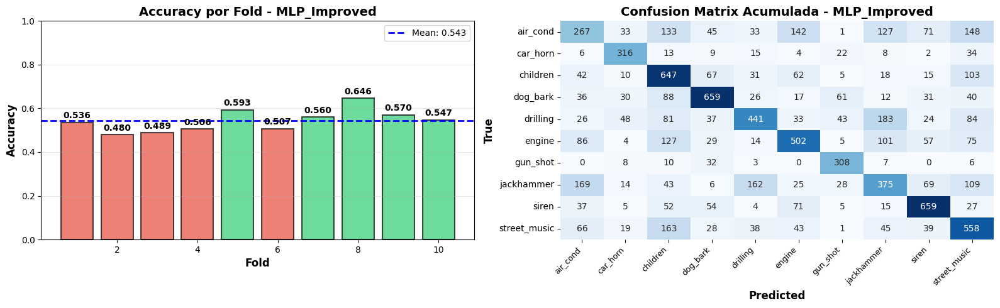

CLASSIFICATION REPORT
              precision    recall  f1-score   support

    air_cond     0.3633    0.2670    0.3078      1000
    car_horn     0.6489    0.7366    0.6900       429
    children     0.4768    0.6470    0.5490      1000
    dog_bark     0.6822    0.6590    0.6704      1000
    drilling     0.5750    0.4410    0.4992      1000
      engine     0.5584    0.5020    0.5287      1000
    gun_shot     0.6430    0.8235    0.7222       374
  jackhammer     0.4209    0.3750    0.3966      1000
       siren     0.6815    0.7094    0.6951       929
street_music     0.4713    0.5580    0.5110      1000

    accuracy                         0.5419      8732
   macro avg     0.5521    0.5718    0.5570      8732
weighted avg     0.5382    0.5419    0.5353      8732


Classification report saved to: MLP_improved_data/MLP_Improved_classification_report.csv

Final mean accuracy (MLP Improved): 0.5433 (54.33%)
Fold accuracies: ['0.536', '0.480', '0.489', '0.506', '0.593', '0.507', '0.5

In [37]:
# Load MLP feature data
try:
    print("Loading MLP feature data...")
    X_raw = np.load('X_mfcc.npy')
    y_raw = np.load('y_mfcc.npy')
    folds = np.load('folds_mfcc.npy')
    print("MLP data loaded successfully!")
    print(f"  X shape: {X_raw.shape}")
    print(f"  y shape: {y_raw.shape}")
    print(f"  folds shape: {folds.shape}")
except FileNotFoundError:
    print("ERROR: .npy files not found! Run feature extraction first.")
    raise

class_names = [
    'air_cond', 'car_horn', 'children', 'dog_bark', 'drilling',
    'engine', 'gun_shot', 'jackhammer', 'siren', 'street_music'
]

mean_acc_mlp, fold_acc_mlp, cm_mlp = run_10_fold_cross_validation(
    X=X_raw,
    y=y_raw,
    folds=folds,
    model_creator_fn=create_mlp_improved,
    model_name="MLP_Improved",
    model_type="MLP",
    preprocess_fn=mlp_preprocess,
    get_callbacks_fn=get_mlp_callbacks,
    base_save_dir=RESULTS_DIR_MLP,
    class_names=class_names,
    batch_size=BATCH_SIZE_MLP,
    max_epochs=MAX_EPOCHS_MLP,
    learning_rate=LEARNING_RATE_MLP,
    use_class_weights=USE_CLASS_WEIGHTS_MLP
)

print(f"\nFinal mean accuracy (MLP Improved): {mean_acc_mlp:.4f} ({mean_acc_mlp*100:.2f}%)")
print(f"Fold accuracies: {[f'{a:.3f}' for a in fold_acc_mlp]}")

<img src="MLP_Improved_data/MLP_Improved_metrics_fold_1.png">
<img src="MLP_Improved_data/MLP_Improved_metrics_fold_2.png">
<img src="MLP_Improved_data/MLP_Improved_metrics_fold_3.png">
<img src="MLP_Improved_data/MLP_Improved_metrics_fold_4.png">
<img src="MLP_Improved_data/MLP_Improved_metrics_fold_5.png">
<img src="MLP_Improved_data/MLP_Improved_metrics_fold_6.png">
<img src="MLP_Improved_data/MLP_Improved_metrics_fold_7.png">
<img src="MLP_Improved_data/MLP_Improved_metrics_fold_8.png">
<img src="MLP_Improved_data/MLP_Improved_metrics_fold_9.png">
<img src="MLP_Improved_data/MLP_Improved_metrics_fold_10.png">
<img src="MLP_Improved_data/MLP_Improved_final_analysis.png">


### **Evaluation of MLP Performance Using MFFCs Features**

1. **Cross-Validation Accuracy Analysis:**

    The **MLP_Improved model serves as the comparative baseline**, exhibiting substantially **lower performance than the convolutional architectures, with a mean accuracy of 0.527.** The **per-fold accuracy** analysis reveals **high volatility and sensitivity to data distribution**:

    - **Performance Range:** The **accuracy fluctuates significantly**, from a **low of 0.461 (Fold 2) and 0.462 (Fold 6)** to a **peak of 0.619 (Fold 8).**

    - **Instability:** **Half of the folds (1, 2, 3, 4, 6) perform below the global mean**, indicated by the red bars. This suggests that the **MLP struggles to generalize effectively** when the training set lacks specific variations present in the test set.

    - This **limited performance (approx. 52.7%) aligns with the theoretical expectation** that flattening the input features **destroys critical spatial (frequency) and temporal relationships**, forcing the model to rely on raw statistical correlations rather than structured patterns.

2. **Confusion Matrix Interpretation:**

    The **accumulated confusion matrix shows a much more dispersed error pattern** compared to the CNN models, **highlighting the MLP's difficulty in distinguishing acoustically similar classes**:

    - **Classes with Reasonable Performance:**
        - **children_playing (625), siren (622), and dog_bark (599)** remain the **most recognizable classes**. Their **distinct spectral energy peaks allow the MLP to identify them even without temporal context**. **street_music (529) also performs moderately well** but shows **significant leakage into air_conditioner (179) and children_playing (107)**.

3. **Major Confusion Clusters (Structural Failures):**

    - **Mechanical Sounds: There is severe mutual confusion between drilling and jackhammer.**

    - **Jackhammer is misclassified as drilling 196 times.**

    - **Drilling is misclassified as jackhammer 181 times.**

    - **Without the ability to detect the temporal rhythm (which CNNs capture via kernels), the MLP cannot distinguish these two percussive sounds.**

    - **Continuous Noise: Air_conditioner is heavily confused with engine_idling (157 misclassifications). Both are stationary noises where the texture matters more than specific frequencies**, a nuance the MLP fails to capture effectively.

4. **General Assessment:**

    The **MLP_Improved demonstrates the limitations of using dense layers for audio classification**:

    - **Mean Accuracy: ~52.7% (significantly lower than the ~65-72% range of CNNs).**

    - **High Variance: The wide gap between the best fold (0.619) and the worst (0.461) indicates poor robustness.**

    - **Loss of Context:** The inability to distinguish drilling vs. jackhammer or air_conditioner vs. engine_idling confirms that flattening the input removes the temporal and spectral topology necessary for fine-grained discrimination.

5. **Summary:**

    The **MLP_Improved successfully functions as a baseline model, establishing a lower bound for performance**. While it can **identify distinct sounds like sirens or children playing**, it fails to robustly **classify complex urban sounds that share similar frequency footprints**.

    This **analysis validates the architectural choice of CNNs**, proving that **preserving the 2D structure of MFCCs/Spectrograms is essential for achieving high accuracy in the UrbanSound8K dataset**.